In [25]:
%load_ext autoreload
%autoreload 2
import numpy as np
import json, pickle, glob

import matplotlib.pyplot as plt
from src.utils.plotting.car_plotting import plot_cars, plot_multiple_cars

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
sim_dirs = glob.glob('/home/nbuckman/mpc_results/txe_0702/results/*-*')
print("# Sim Dirs: %d"%len(sim_dirs))

# Sim Dirs: 237


In [27]:
CONV_MS_TO_MPH = 2.23694
all_params = []
all_trajs = []
all_vehicles = []
all_dirs = []

for sim_dir in sim_dirs:
    params_path = glob.glob(sim_dir + '/params.json')
    trajs_path = glob.glob(sim_dir + '/trajectories.npy')
    vehicles_path = glob.glob(sim_dir + '/other_vehicles.p')
    
    if len(trajs_path) > 0:
        all_params += [json.load(open(params_path[0],'rb'))]
        all_trajs += [np.load(trajs_path[0])]
        all_vehicles += [pickle.load(open(vehicles_path[0],'rb'))]
        all_dirs += [sim_dir]
print("# Simulations: %d"%len(all_dirs))

# Simulations: 232


In [28]:
n_mpc_end = 300

In [5]:
p_coop_array = np.array([all_params[exi]['p_cooperative'] for exi in range(len(all_params))])
distances_array = np.array([all_trajs[exi][:,0,n_mpc_end] - all_trajs[exi][:,0,0] for exi in range(len(all_params))])
passing_array = np.array([np.sum(all_trajs[exi][0,0,n_mpc_end] > all_trajs[exi][:,0,n_mpc_end]) for exi in range(len(all_params))])

p_distance_dict = {}
p_passing_dict = {}
for exi in range(distances_array.shape[0]):
    if p_coop_array[exi] not in p_distance_dict:
        p_distance_dict[p_coop_array[exi]] = []
    p_distance_dict[p_coop_array[exi]] += [distances_array[exi]]
    
    if p_coop_array[exi] not in p_passing_dict:
        p_passing_dict[p_coop_array[exi]] = []
    p_passing_dict[p_coop_array[exi]] += [passing_array[exi]]
    
for p in p_distance_dict:
    p_distance_dict[p] = np.array(p_distance_dict[p])
for p in p_passing_dict:
    p_passing_dict[p] = np.array(p_passing_dict[p])
p_unique = np.array(list(p_distance_dict.keys()))
p_unique = np.sort(p_unique)

In [6]:
params = all_params[0]
total_time = params["T"] * params['p_exec'] * params['n_mpc']
total_time = params["dt"] * n_mpc_end
print("Total Sim Time", total_time)

Total Sim Time 60.0


# Let's look at a couple examples

In [7]:
n_plotting_sims = 10

In [8]:
print(n_plotting_sims)

10


/home/nbuckman/mpc_results/txe_0702/results/2021-2dg4-20210703-064524


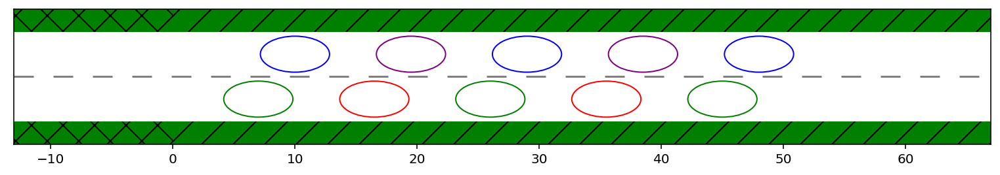

/home/nbuckman/mpc_results/txe_0702/results/4c55-gde1-20210703-134928


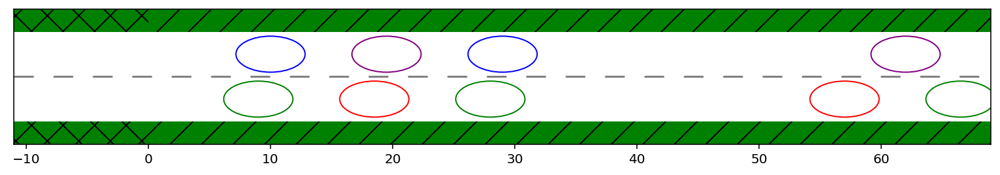

/home/nbuckman/mpc_results/txe_0702/results/fb6e-9455-20210704-231256


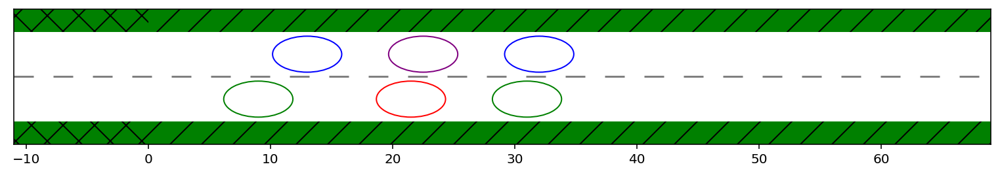

/home/nbuckman/mpc_results/txe_0702/results/ee32-g05b-20210705-080005


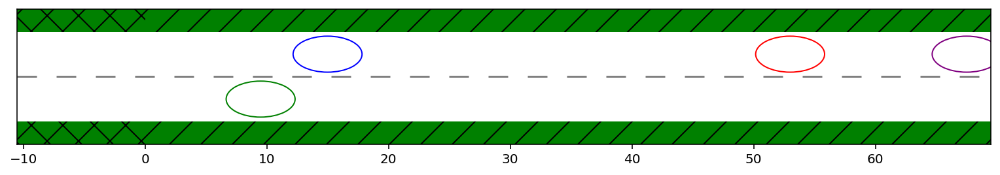

/home/nbuckman/mpc_results/txe_0702/results/40f3-g935-20210702-193237


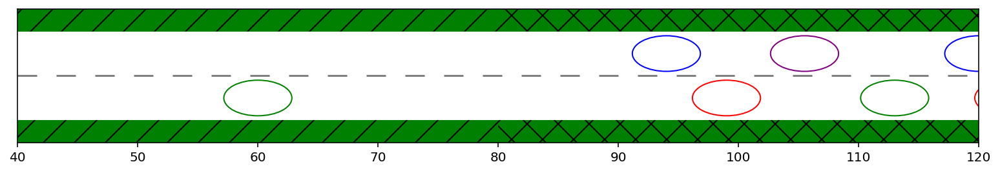

/home/nbuckman/mpc_results/txe_0702/results/6g78-0d05-20210703-025851


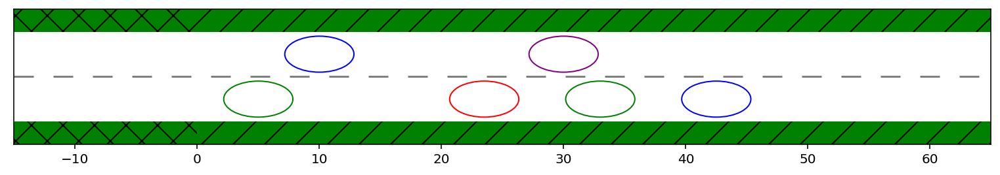

/home/nbuckman/mpc_results/txe_0702/results/9437-7h30-20210702-162543


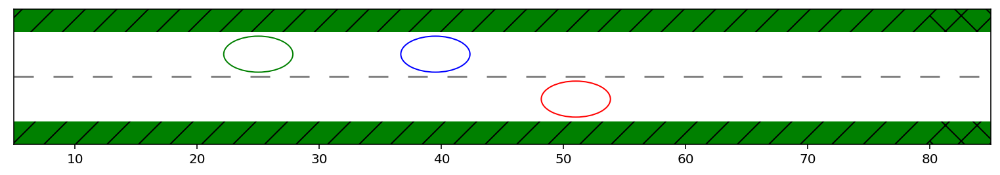

/home/nbuckman/mpc_results/txe_0702/results/7ac4-a329-20210705-214540


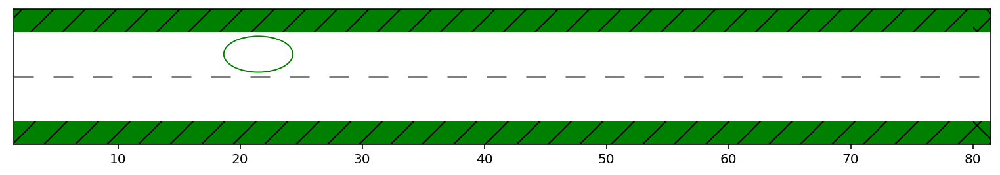

/home/nbuckman/mpc_results/txe_0702/results/c28f-1394-20210702-150723


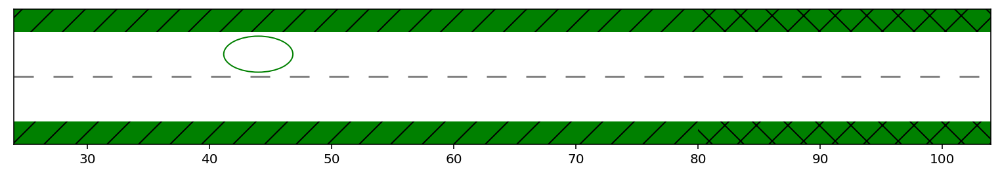

/home/nbuckman/mpc_results/txe_0702/results/92b3-cdd0-20210703-052117


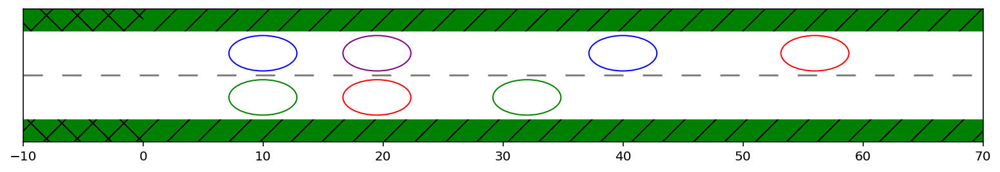

In [9]:
for si in range(min(n_plotting_sims, len(all_dirs))):
    log_dir = sim_dirs[si]
    params_path = glob.glob(log_dir + '/params.json')
    trajs_path = glob.glob(log_dir + '/trajectories.npy')
    vehicles_path = glob.glob(log_dir + '/other_vehicles.p')
    world_path = glob.glob(log_dir + '/world.p')
#     ambulance_path = glob.glob(log_dir + '/*/ambulance.p')

    if len(trajs_path) > 0:
        params = json.load(open(params_path[0],'rb'))
        trajs = np.load(trajs_path[0])
        vehicles = pickle.load(open(vehicles_path[0],'rb'))
        world = pickle.load(open(world_path[0],'rb'))
#         ambulance = pickle.load(open(ambulance_path[0],'rb'))
    other_trajs = [trajs[i,:] for i in range(0, trajs.shape[0])]

#     for k in range(trajs.shape[2]):
#         plot_multiple_cars(k, world, ambulance, trajs[0,:], other_trajs, None, "ellipse", camera_positions=None,
#                            car_labels=None, car_colors=None)
    print(log_dir)
    plot_multiple_cars(0, world, vehicles[0], None, other_trajs, None, "ellipse", camera_positions=None,
                       car_labels=None, car_colors=None, all_other_vehicles=vehicles)

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d967-b53c-20210526-230656


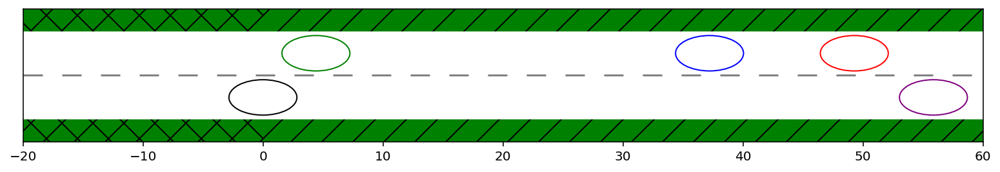

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d0e7-h712-20210527-030249


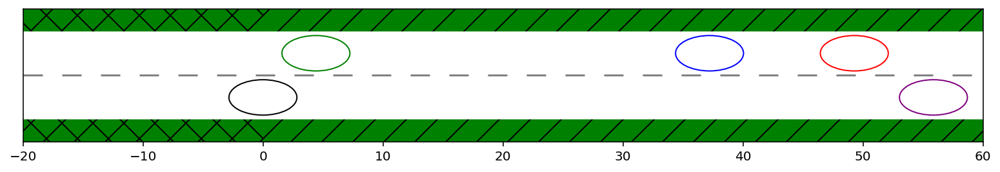

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/27fa-g936-20210525-161257


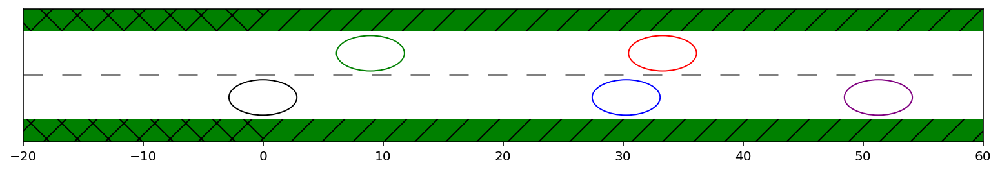

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2hh4-g80g-20210527-084308


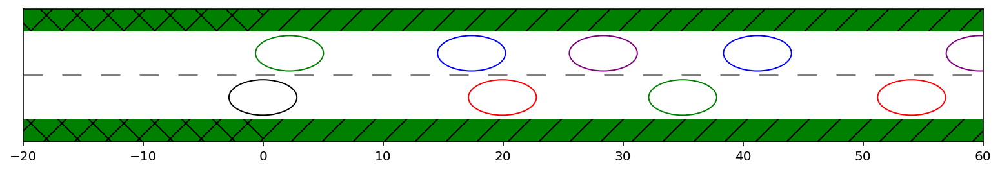

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2d5h-1532-20210527-023354


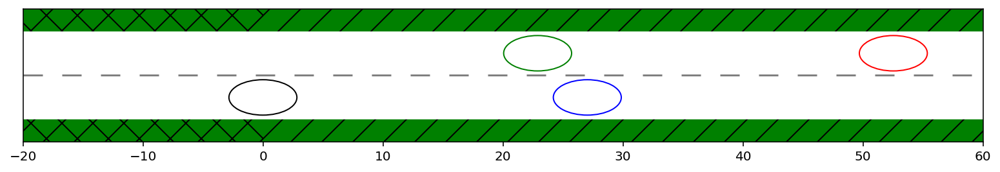

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f64e-ba9g-20210525-204918


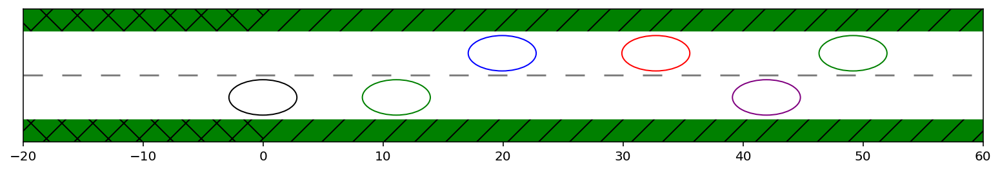

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/86g5-5c91-20210527-040619


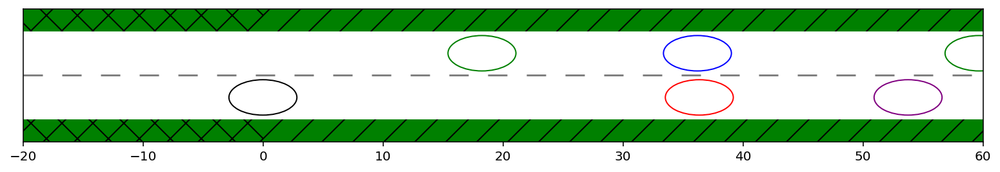

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/1e0h-dh95-20210527-041720


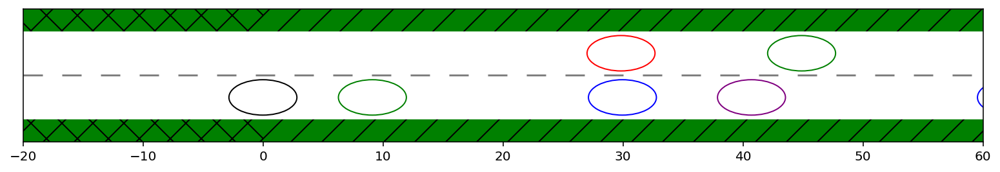

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6ba5-4539-20210526-153236


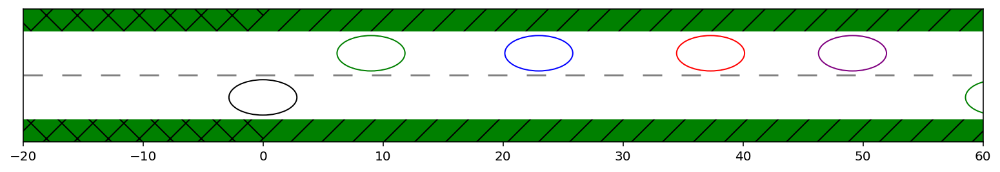

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/5c84-dee8-20210525-235810


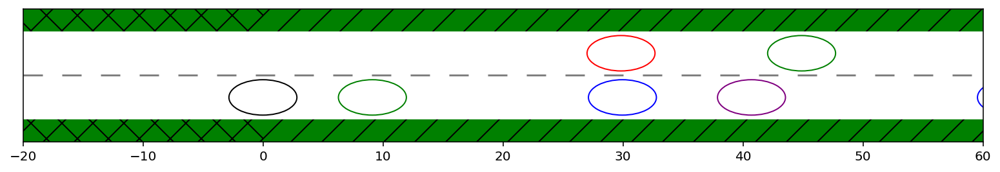

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/dbe4-c470-20210525-164911


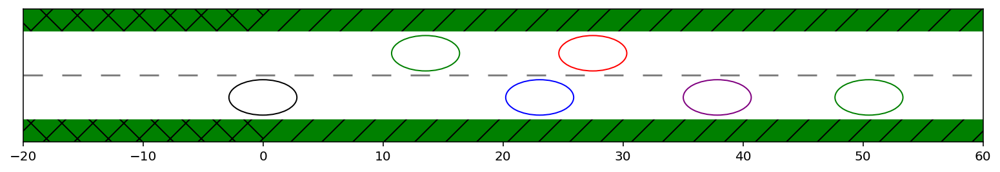

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/28gf-3bg7-20210526-063618


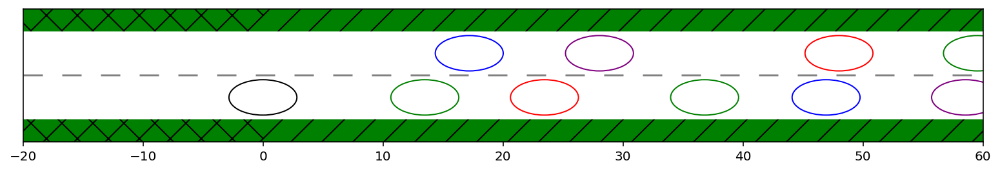

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d16a-dg76-20210526-001122


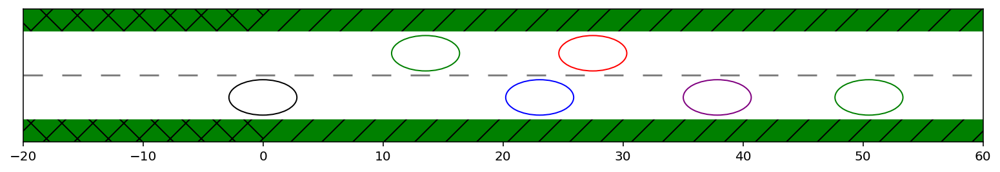

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4g8d-fc6g-20210526-053323


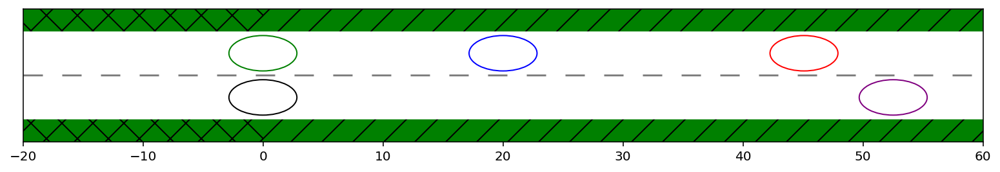

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f22a-g217-20210526-094329


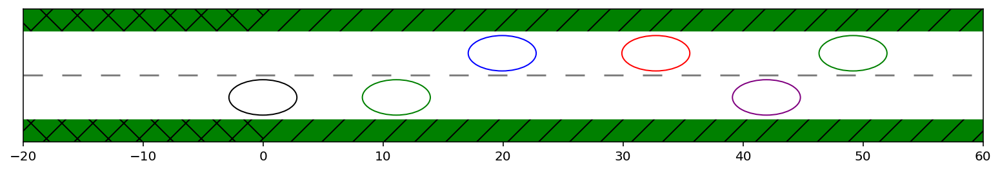

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0ad3-c645-20210526-143714


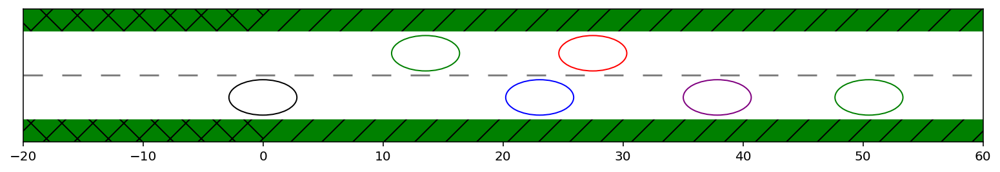

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8ee6-h316-20210526-223722


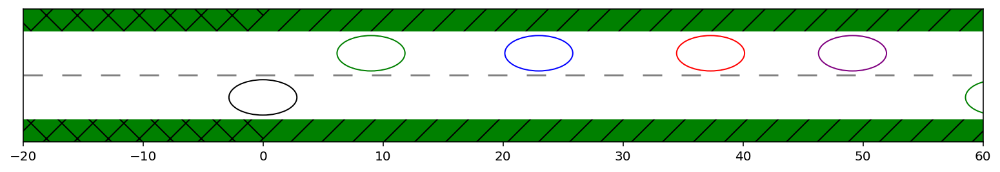

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8077-e719-20210526-111555


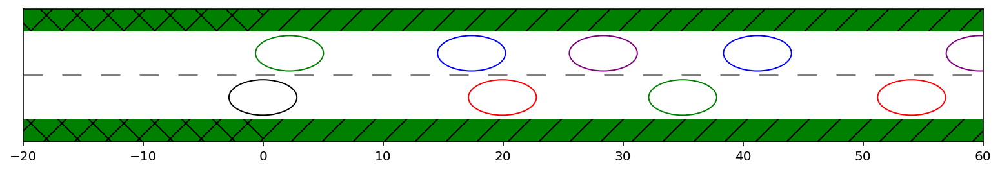

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/9853-c5a6-20210527-035855


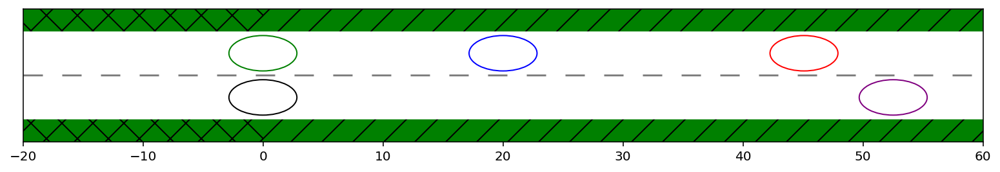

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0ehd-dhb4-20210525-130459


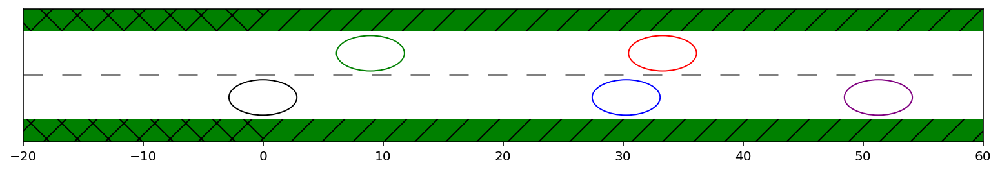

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/84da-hggh-20210526-222706


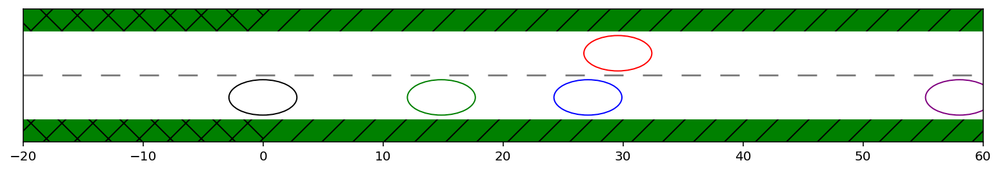

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0fgd-e2hf-20210525-143130


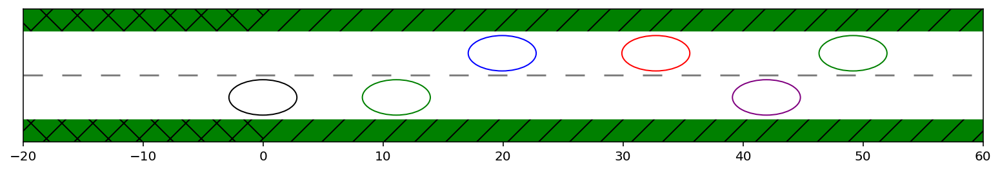

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g0bd-0d37-20210525-183147


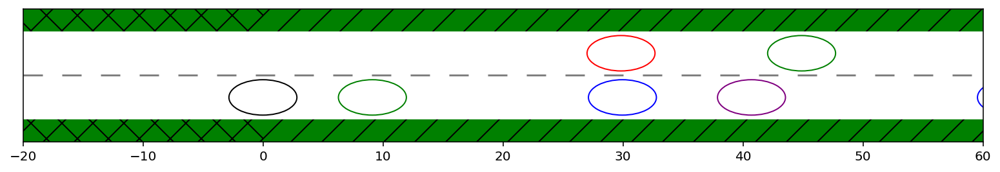

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4af2-a7dg-20210527-090549


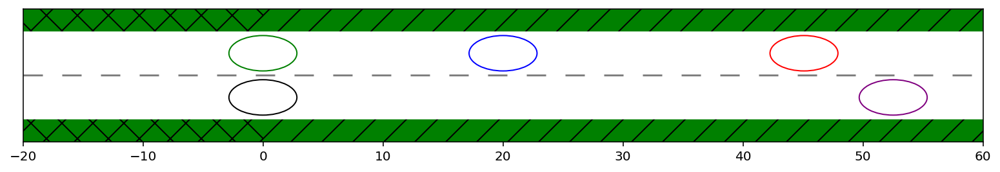

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/18d2-g4e4-20210526-195809


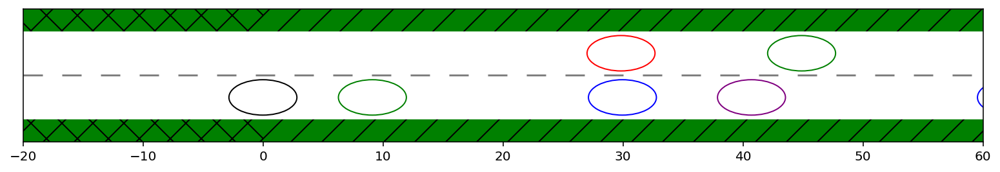

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/c5g5-c541-20210526-030225


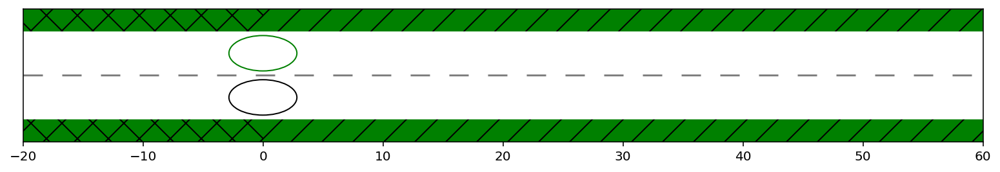

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/c820-h53e-20210526-143600


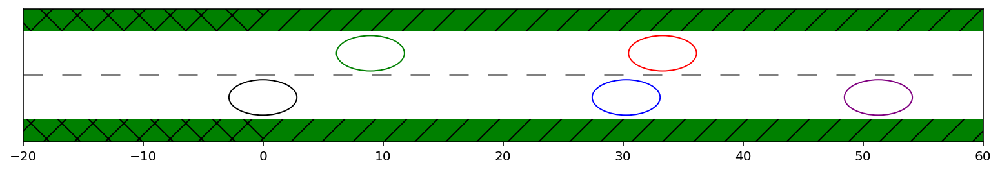

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0622-b875-20210527-042303


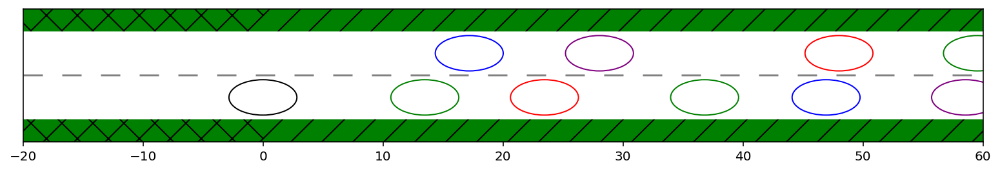

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g9c0-0e56-20210525-192024


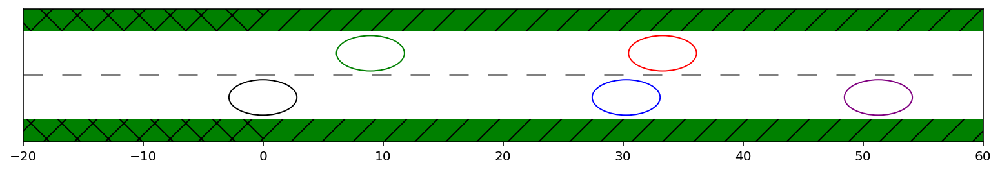

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f1be-26f2-20210525-170213


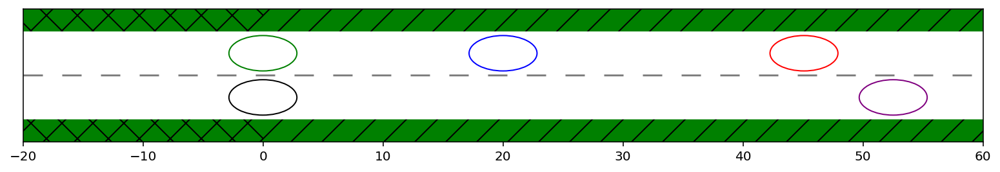

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6dcd-9b32-20210526-034927


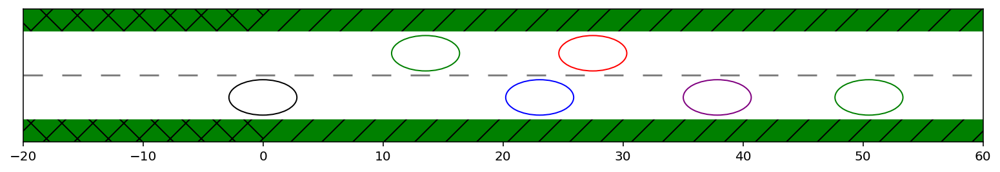

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/08d1-baa8-20210526-003043


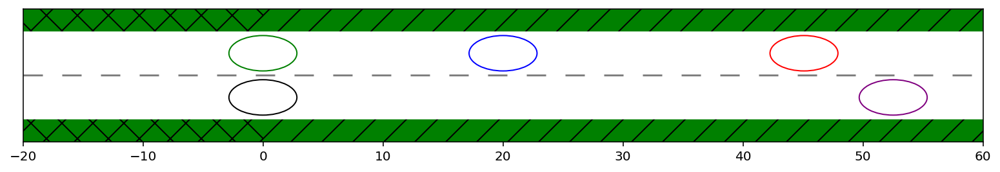

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/04b2-4cae-20210526-150228


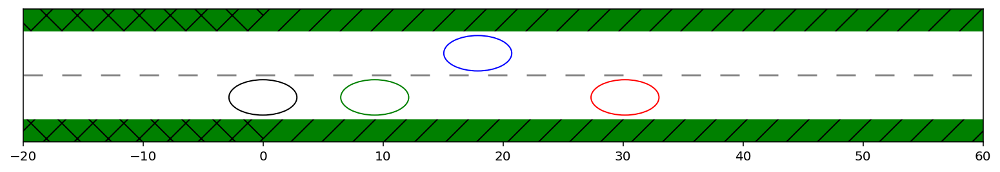

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d7af-c6g0-20210526-114416


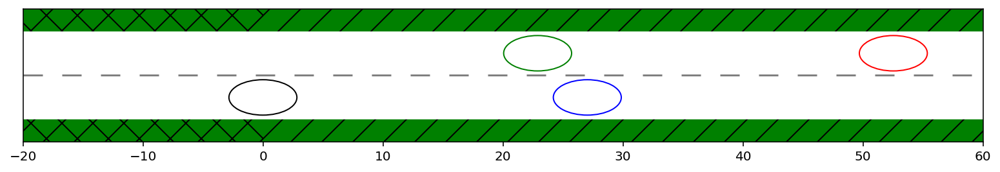

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g01c-aagd-20210526-174629


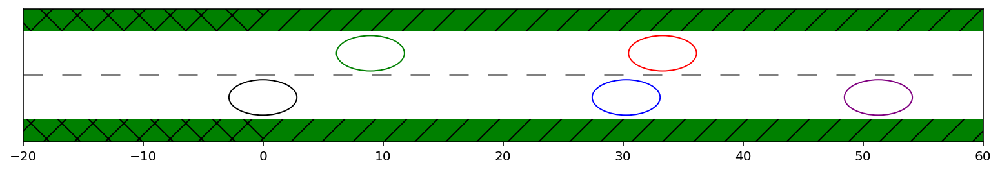

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/3hed-cc2h-20210525-210608


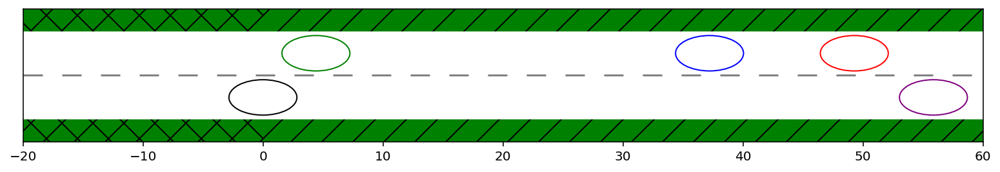

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0165-gf5e-20210526-091601


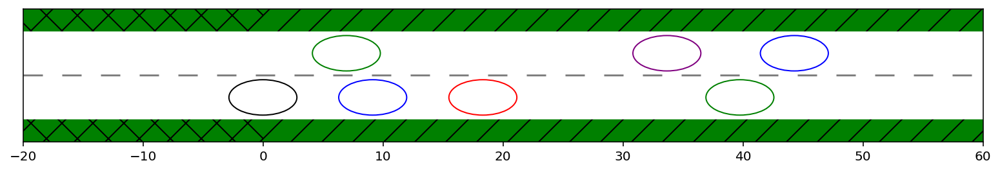

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/40h8-6862-20210526-173646


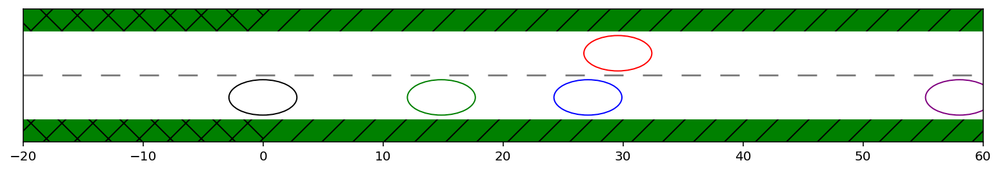

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/3fhb-g4fc-20210525-222523


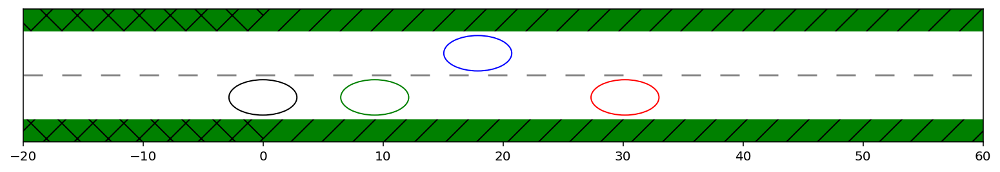

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/e13c-d839-20210527-081435


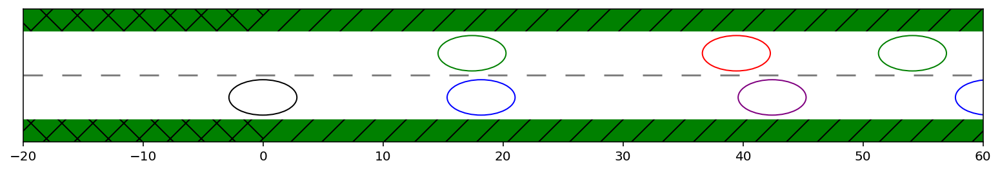

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a5b4-g37f-20210526-081134


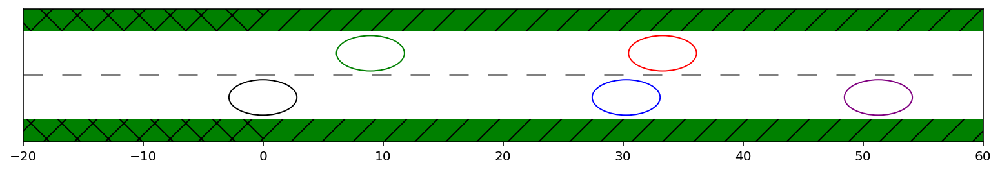

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/85e9-08e5-20210526-034253


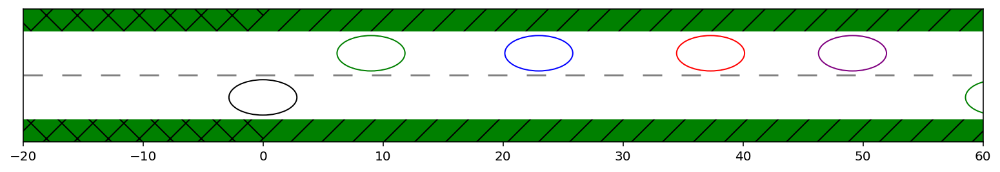

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/435c-a3ga-20210525-154133


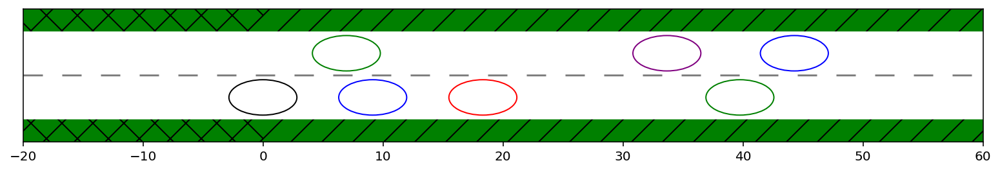

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/b5cb-5gh2-20210526-205631


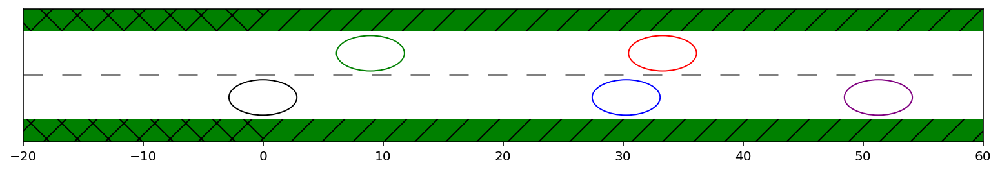

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a81c-5g57-20210525-130459


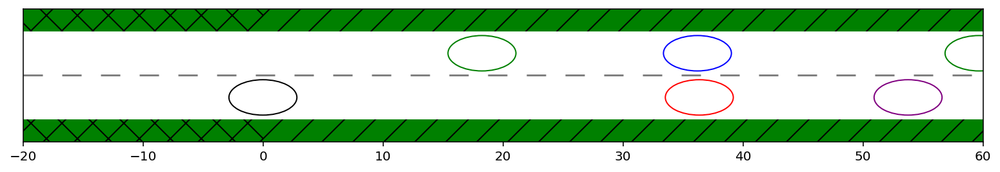

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2d04-h141-20210525-160719


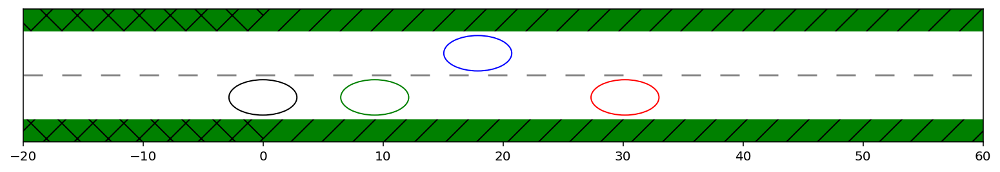

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/42bh-e5bd-20210527-043713


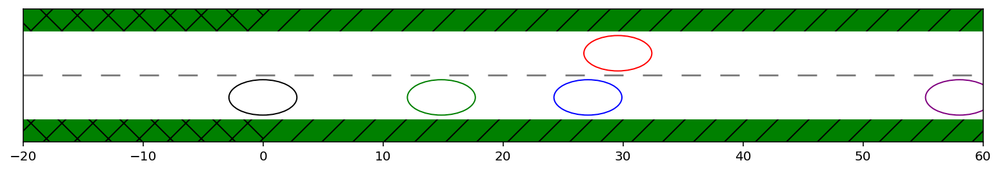

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/371e-58b9-20210525-212012


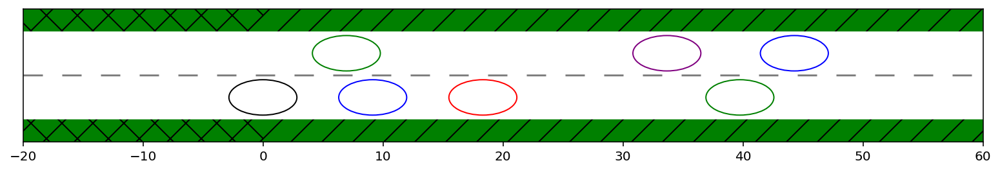

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8f7h-4360-20210526-051911


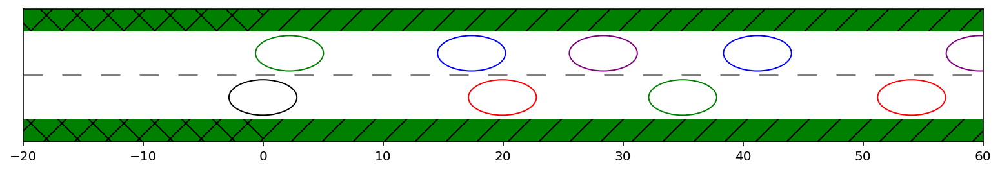

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/3e24-g260-20210526-074055


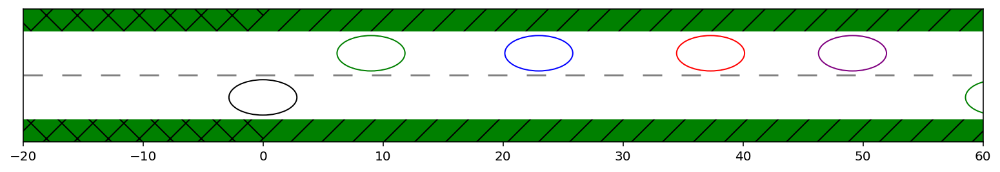

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/923h-ebd6-20210526-064117


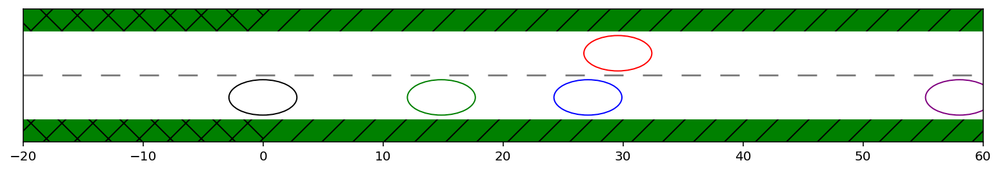

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a790-g266-20210526-112531


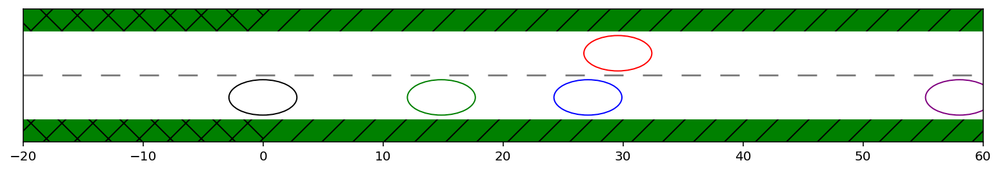

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/89g8-012g-20210527-060536


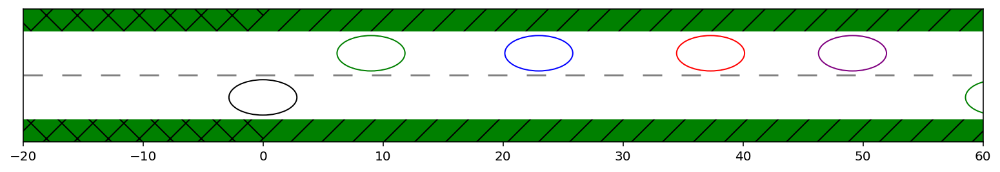

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/fegc-f065-20210526-014735


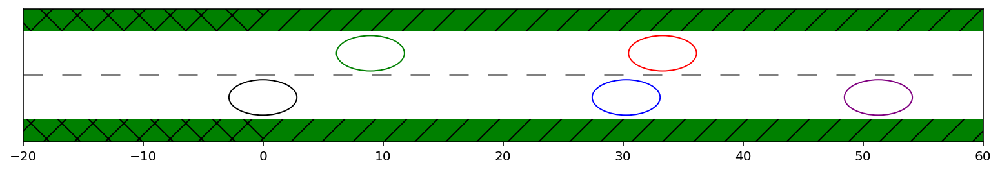

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a5g3-adab-20210525-130459


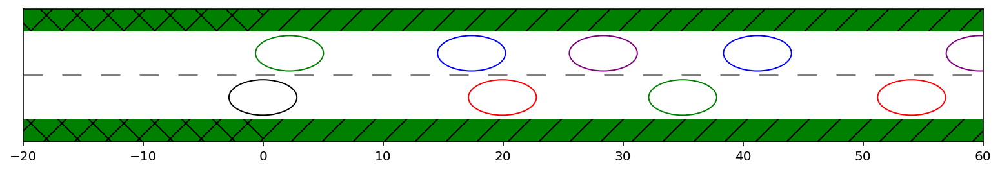

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0d38-2ehf-20210526-043133


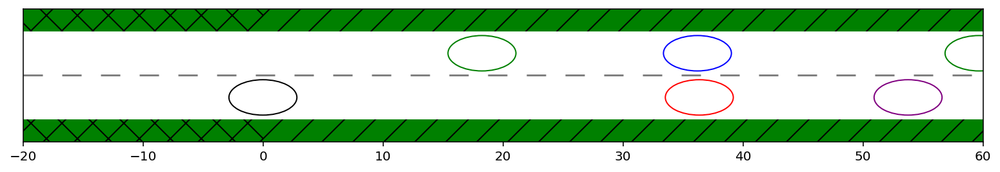

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/346d-592a-20210525-152723


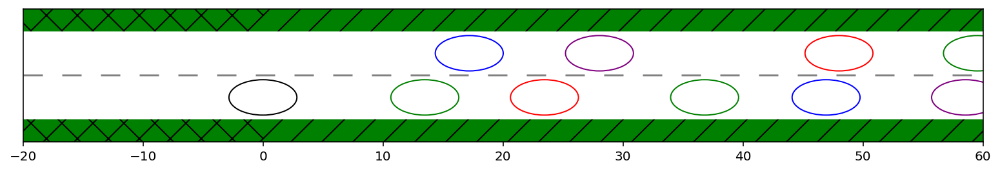

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/cc5e-b43e-20210525-203328


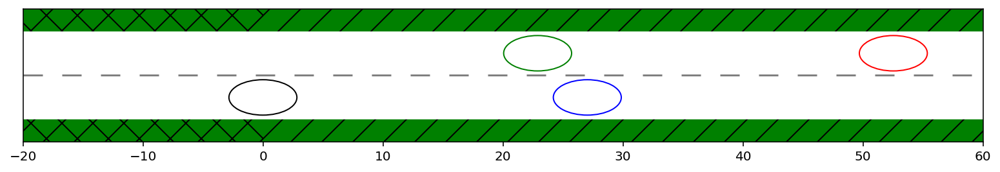

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d1e0-911d-20210525-161736


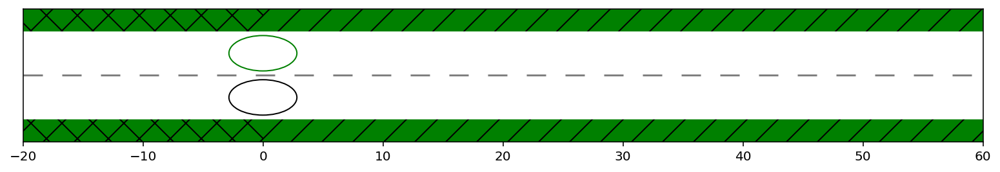

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/262d-5f88-20210526-072624


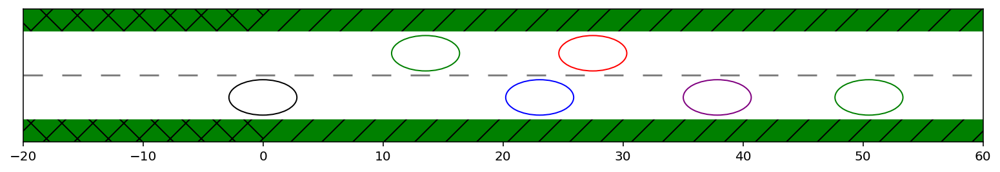

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a71g-g4he-20210527-072335


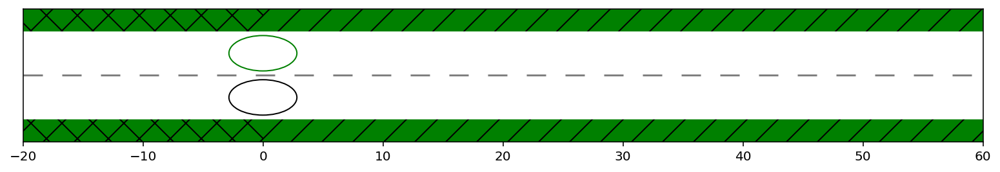

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g4b2-786d-20210526-131023


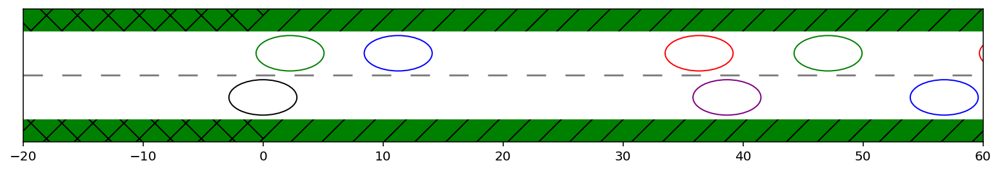

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/edg7-86gf-20210526-204914


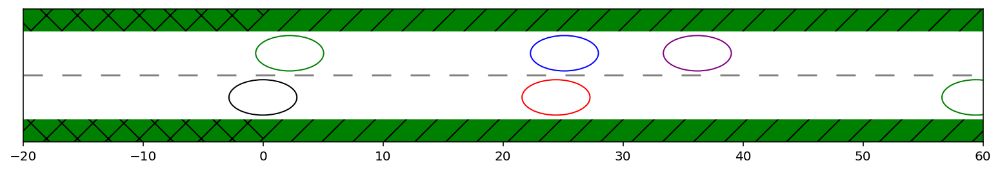

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/e379-3dgd-20210526-051547


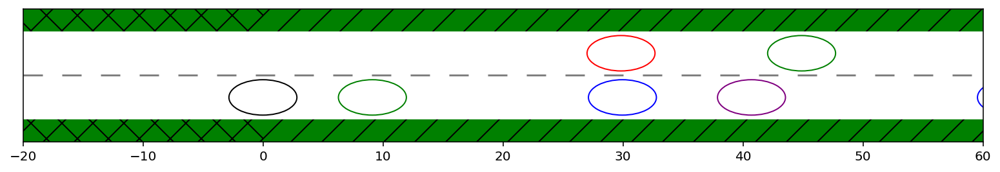

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/86ca-a0h1-20210527-022842


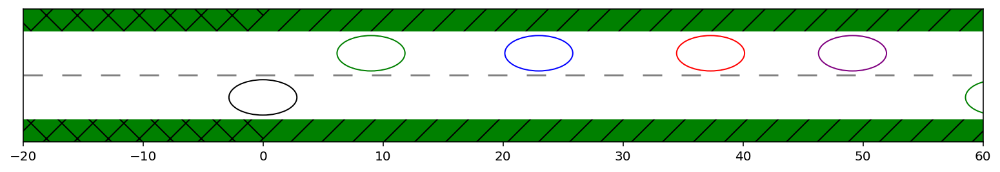

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/h245-a02e-20210527-114011


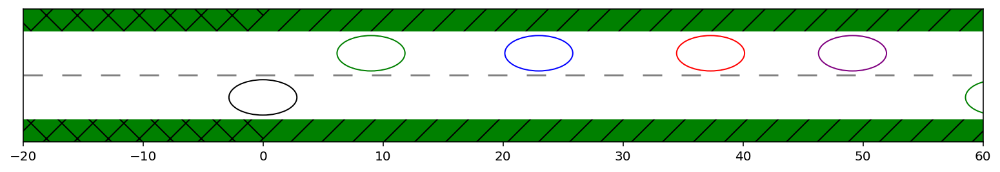

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/21f9-hch0-20210526-090027


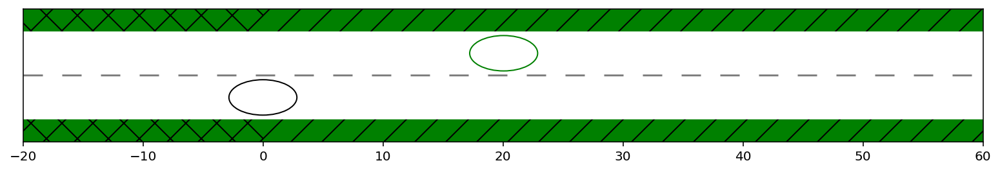

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4ab6-d461-20210525-203240


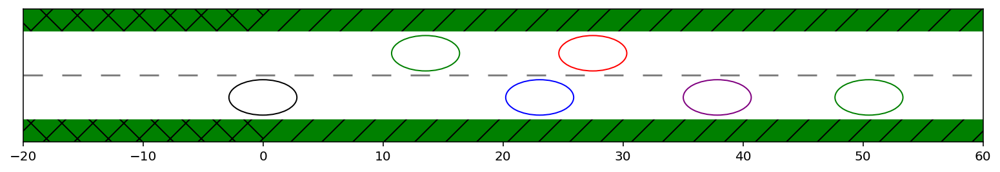

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/b783-7183-20210527-065845


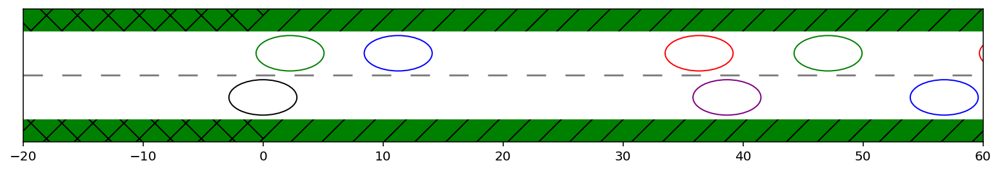

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/66f5-hgc6-20210525-144400


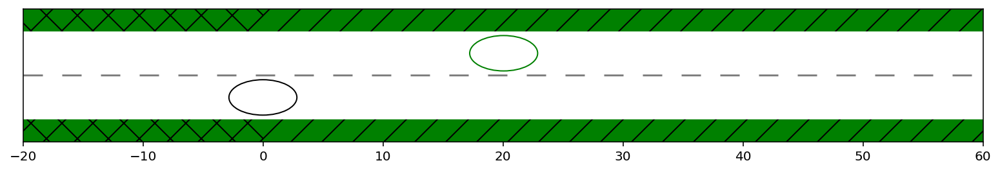

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/ah3e-7he9-20210527-103223


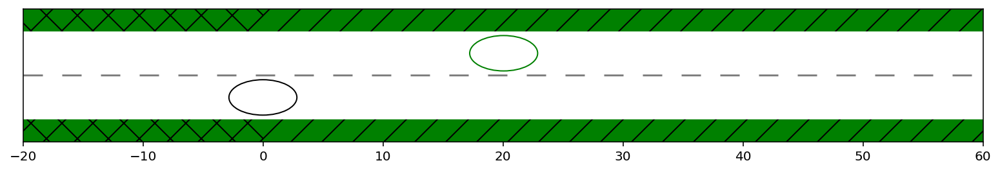

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8df0-e102-20210526-134041


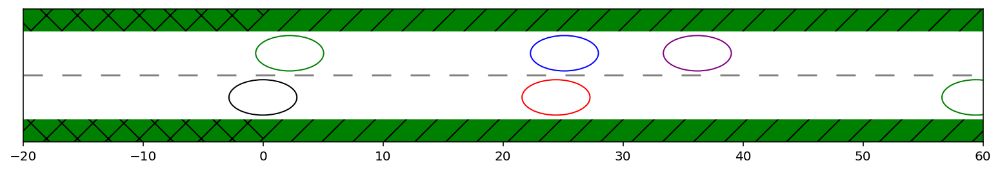

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/afh8-7c5h-20210525-174114


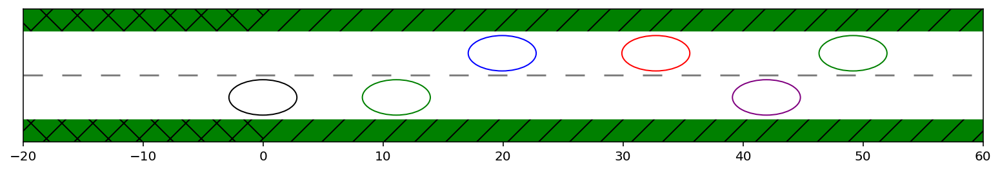

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/745e-bhff-20210526-030400


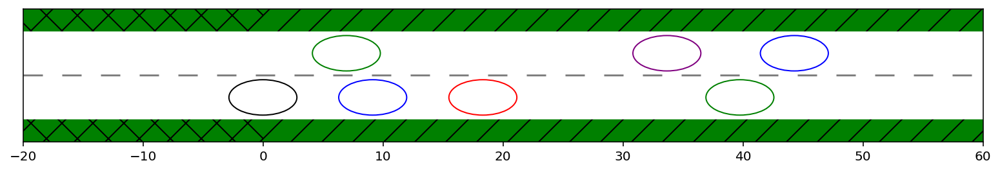

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/h017-29c4-20210527-022356


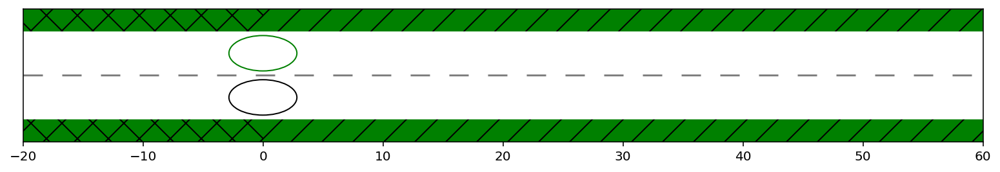

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/ac8c-6e36-20210526-031821


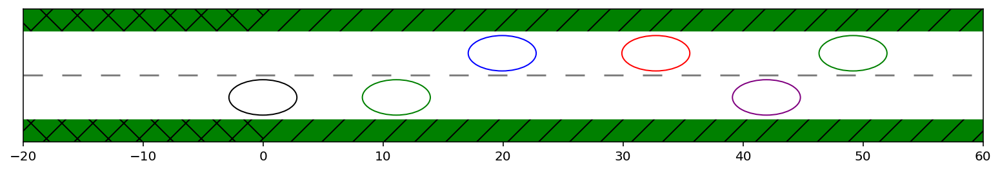

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/9995-f87d-20210526-170535


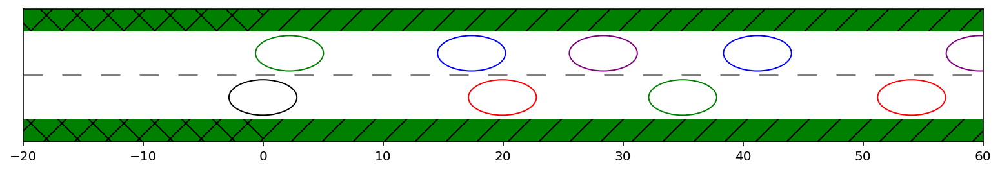

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6d8h-1b2e-20210525-211721


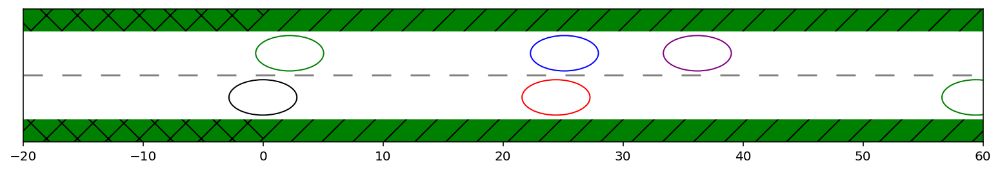

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/3a58-29d4-20210527-053303


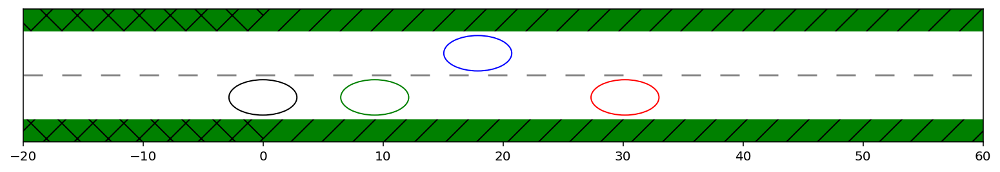

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/3ba2-c972-20210526-161301


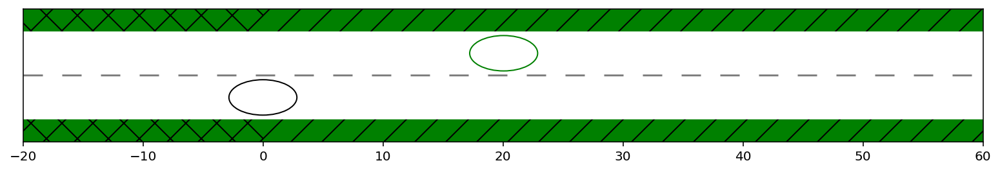

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d5f2-32de-20210525-130459


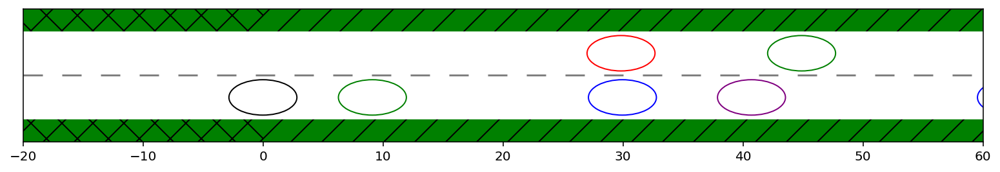

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f6e9-3832-20210526-222904


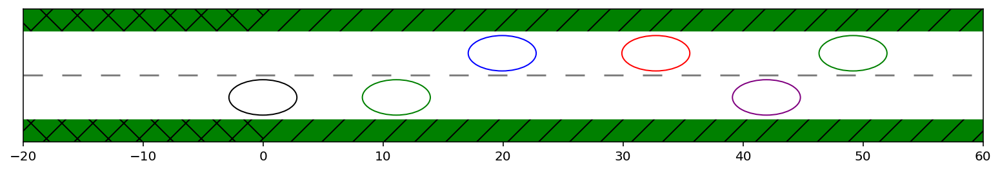

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a471-8e9d-20210526-110000


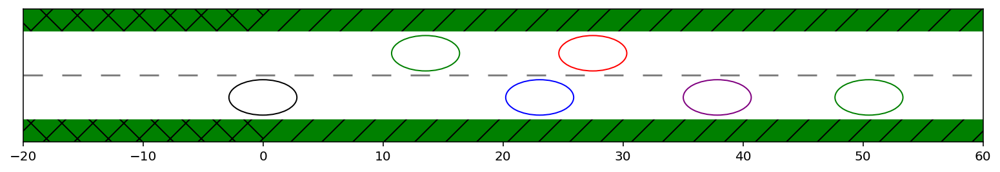

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/603c-864g-20210526-162506


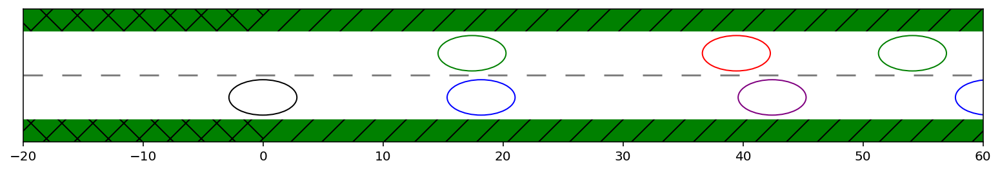

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/bc0c-3980-20210526-153957


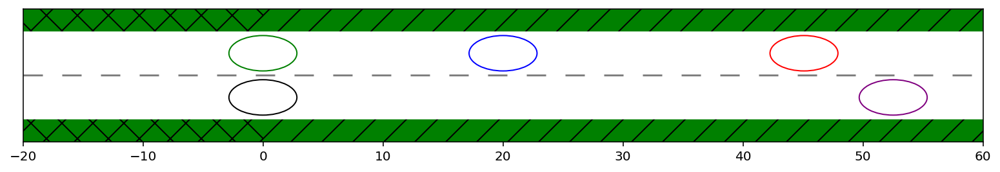

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f9hf-gf5h-20210525-130459


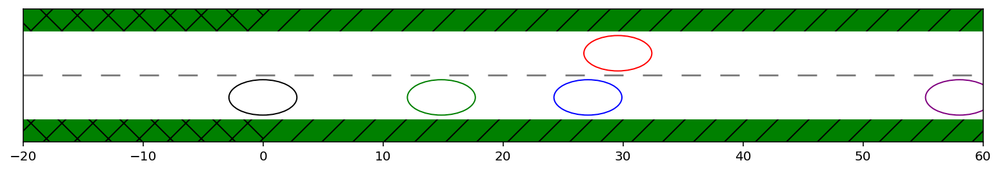

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2aa2-hg86-20210526-194652


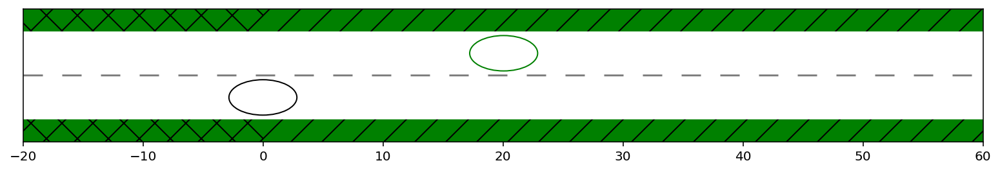

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/7ah5-4860-20210526-141020


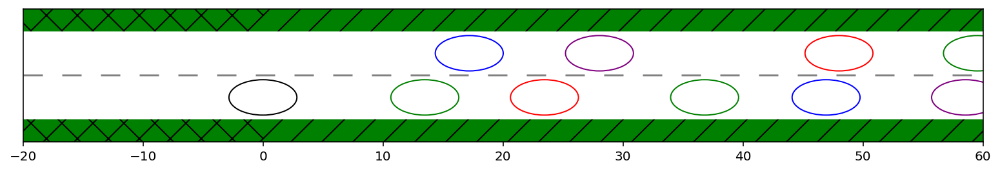

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/1cb5-ae60-20210526-191813


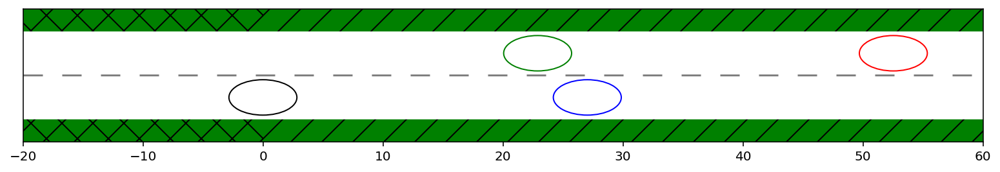

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f29g-gc8f-20210526-003614


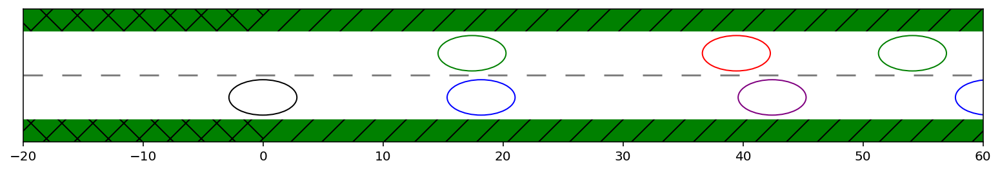

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8467-0bc5-20210527-014832


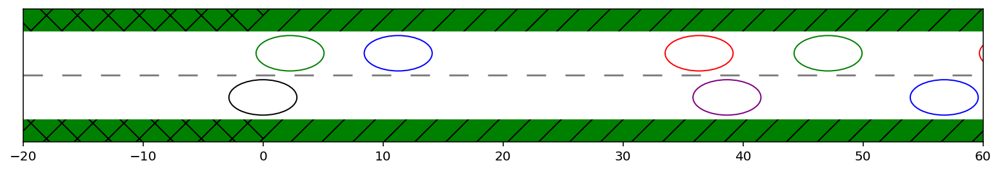

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/1ac4-hh38-20210526-224652


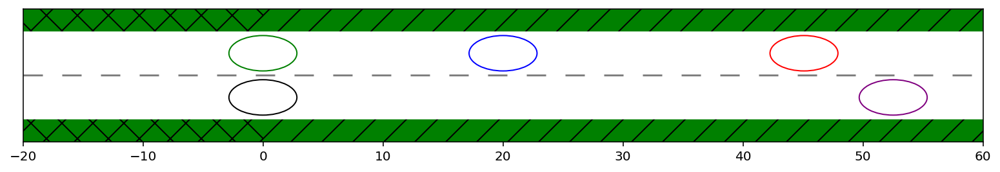

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/125d-eaeh-20210527-065405


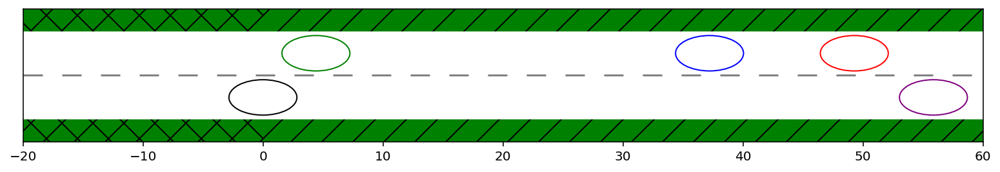

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6dgc-f6fd-20210525-184729


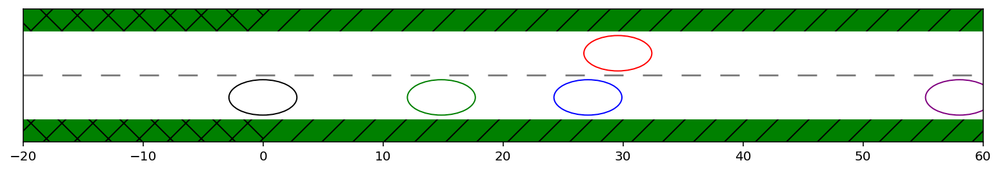

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/964f-917f-20210526-093540


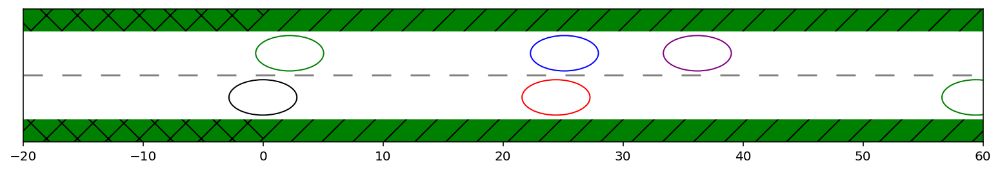

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/f07e-2ddd-20210526-232330


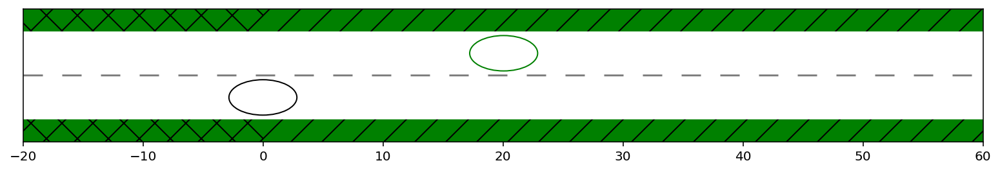

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/72ba-38fd-20210525-183140


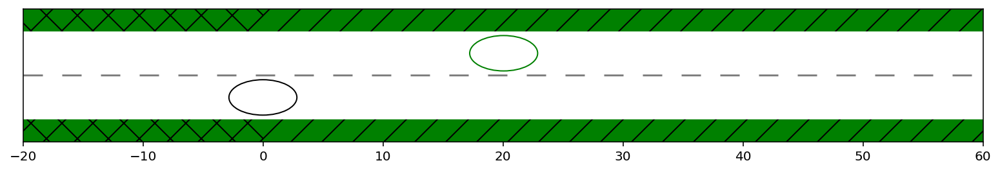

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/hfa2-4455-20210526-055508


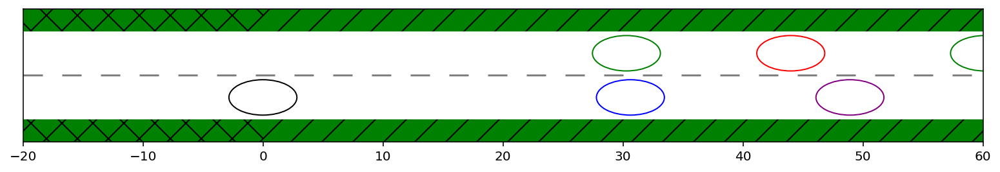

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6217-cb7d-20210527-103026


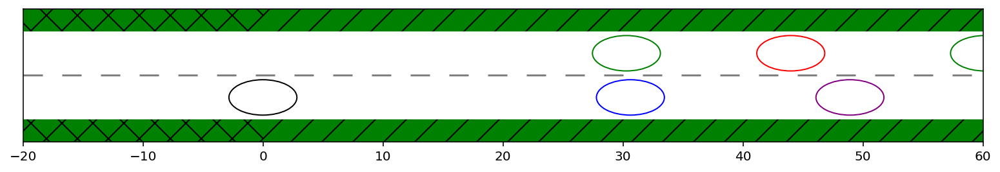

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/26a4-0358-20210526-045939


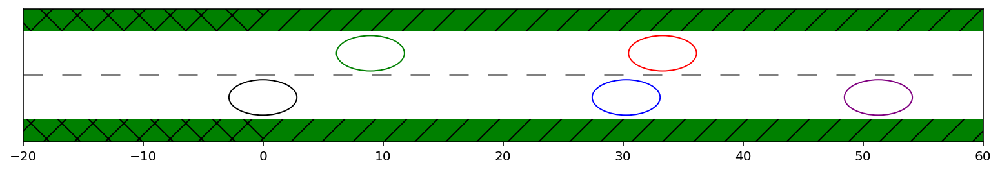

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6e3a-d383-20210526-004541


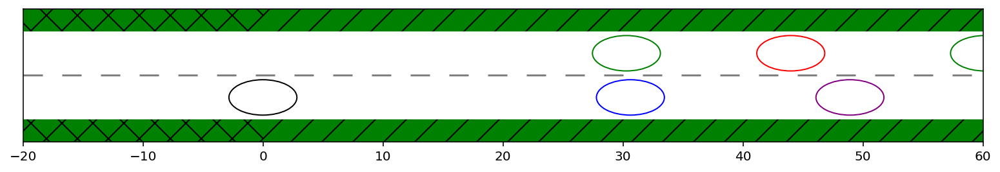

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2734-8591-20210525-225615


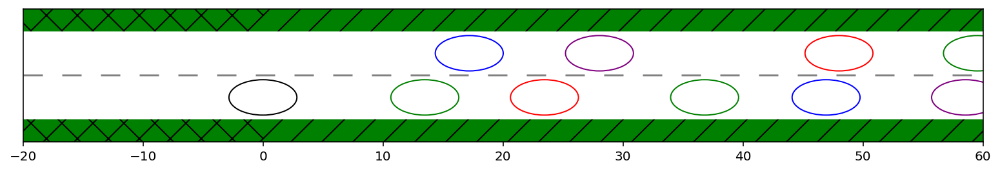

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/678f-d4ef-20210526-153458


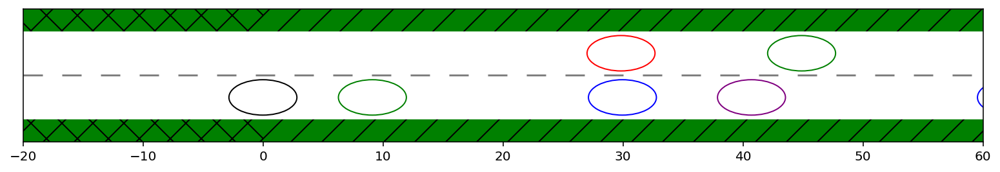

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/827b-a50b-20210526-103839


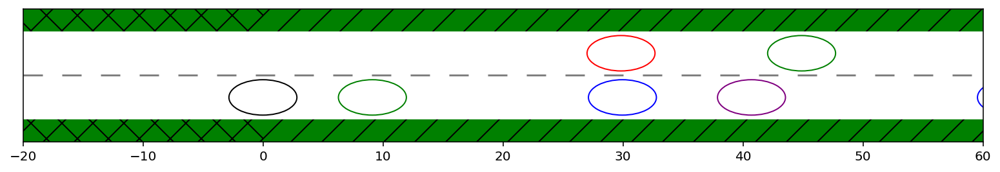

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/hb09-7dh3-20210526-210747


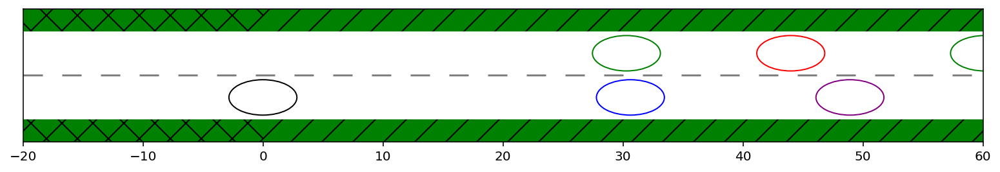

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/08f3-e12d-20210527-002230


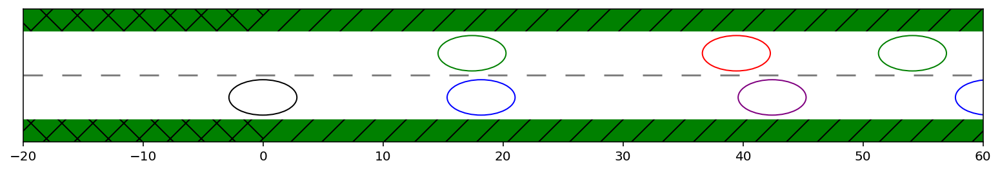

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/70eg-c0h0-20210526-083957


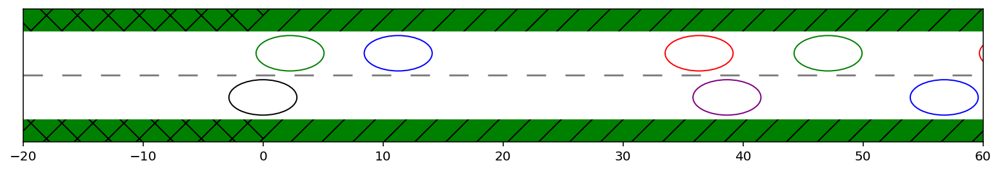

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g26b-adf0-20210526-112430


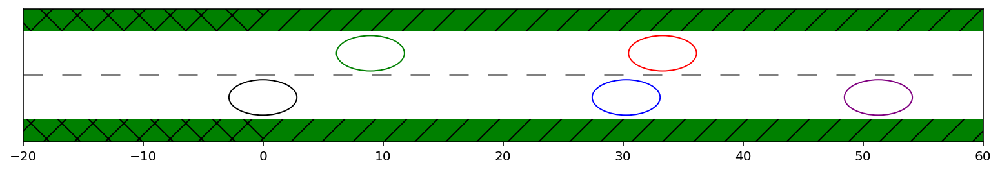

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/67fa-fca3-20210525-152040


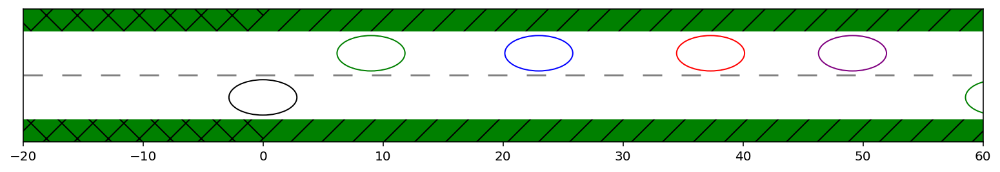

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a22a-c098-20210526-084351


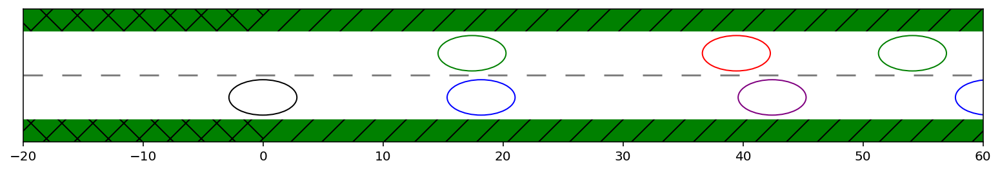

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/eh8e-4bd1-20210526-192305


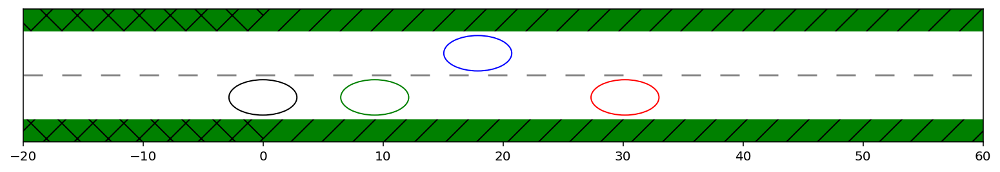

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/52g9-b899-20210525-164216


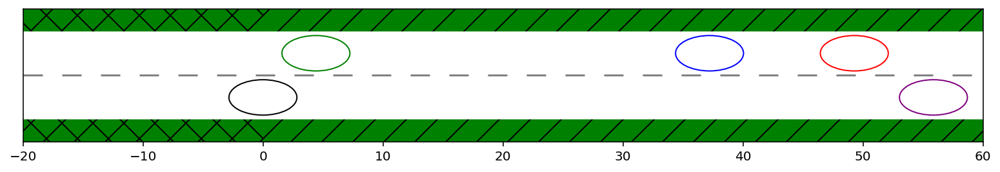

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/401h-8g81-20210526-221657


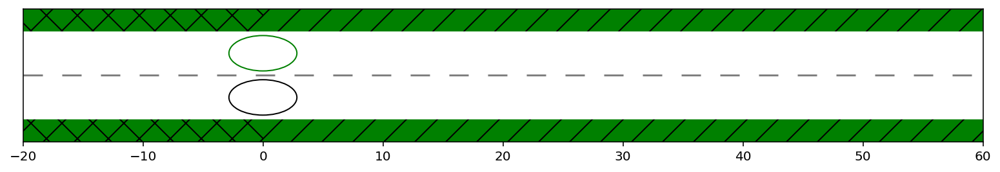

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/5a93-5ggh-20210526-191749


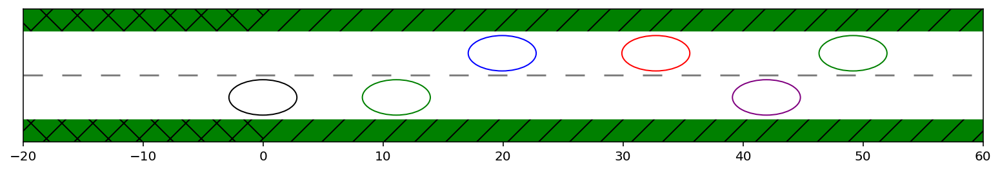

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4b79-f7ad-20210526-030902


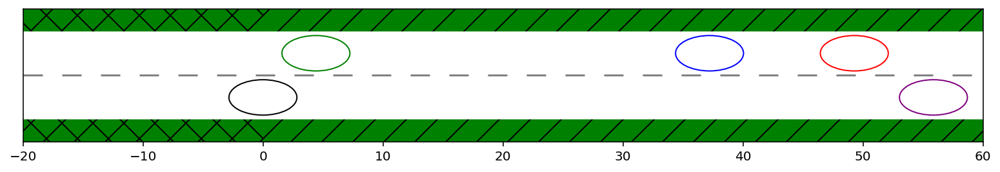

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/1113-8h4e-20210527-112009


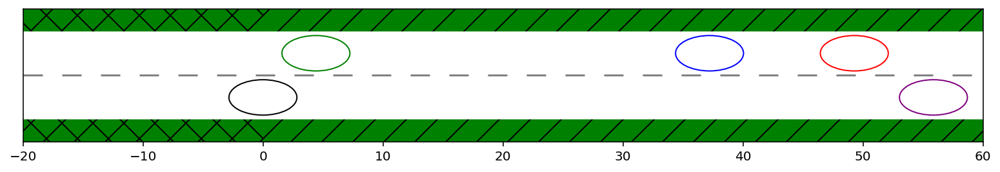

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8e11-g777-20210526-210828


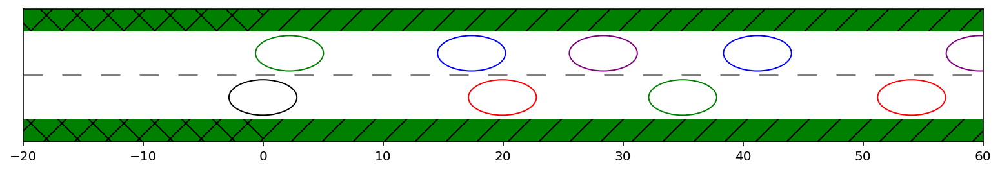

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/74gf-119d-20210525-130459


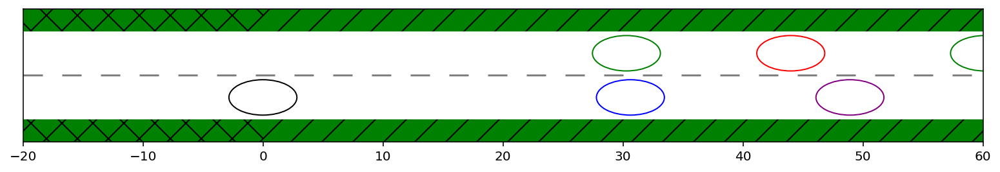

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/de03-3d8c-20210525-232634


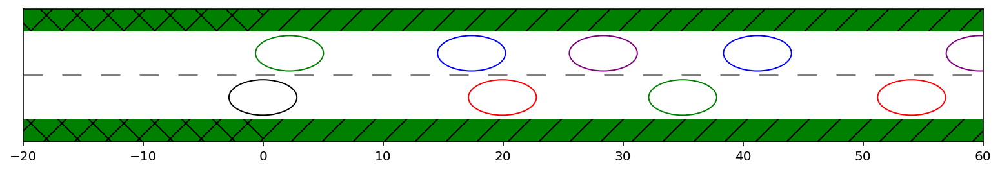

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8h37-2b21-20210526-140149


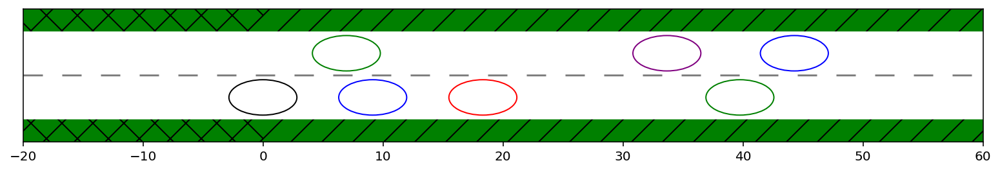

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/fd1h-e7c8-20210526-181131


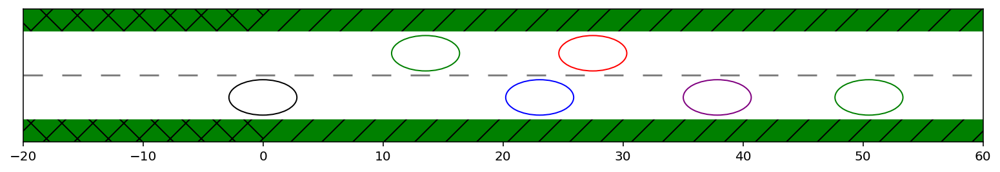

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0b47-22ad-20210525-220655


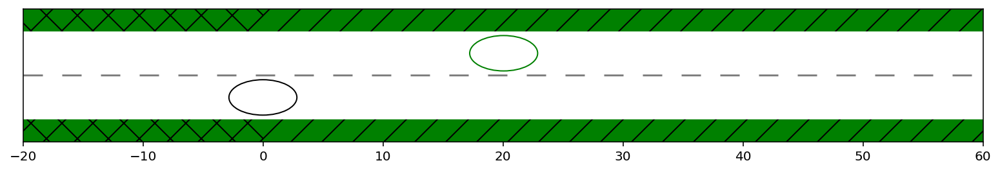

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g078-bbf2-20210526-002547


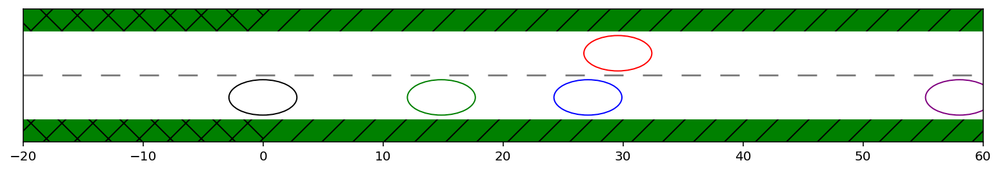

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/aee9-2gfh-20210526-145504


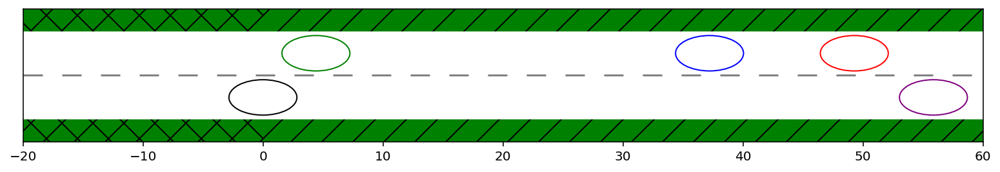

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6ee0-bagg-20210525-130459


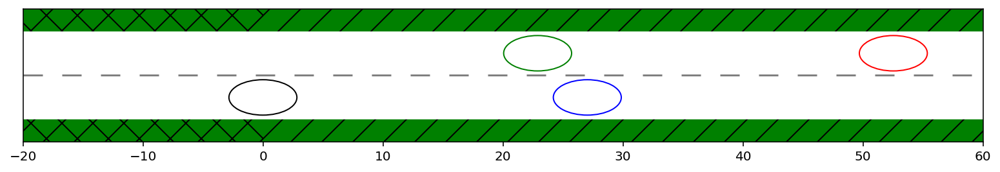

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/cg5b-df93-20210526-014742


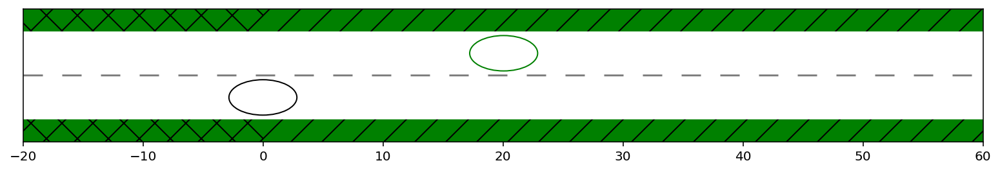

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0cfe-ce8c-20210526-040849


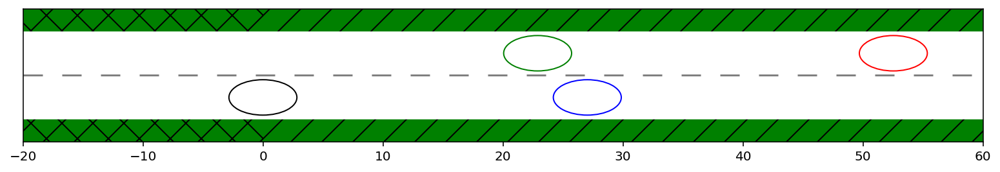

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/18ff-89d3-20210526-095039


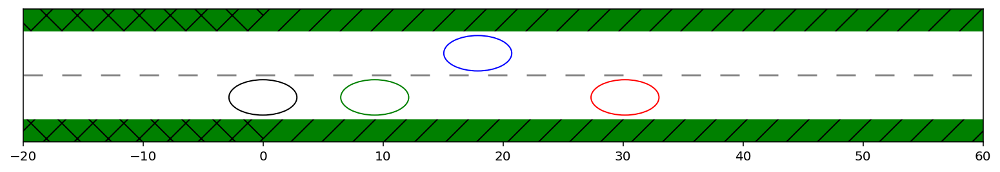

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g1ea-282e-20210526-053014


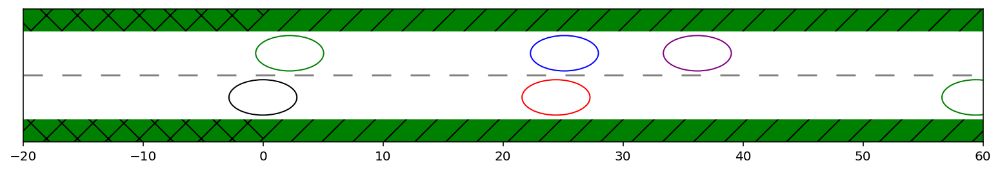

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/bch3-81bc-20210525-192856


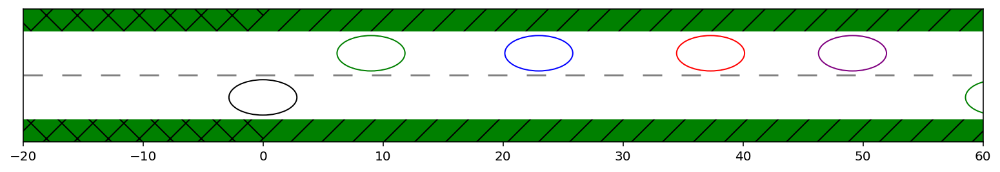

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/5891-727h-20210527-092826


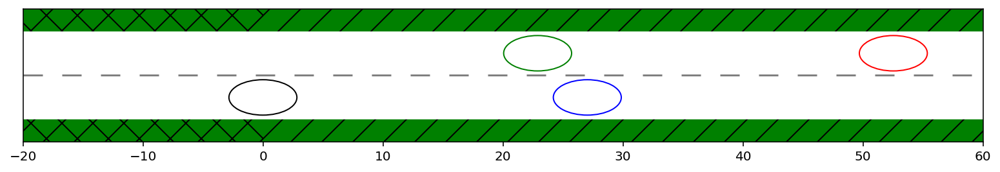

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4873-565g-20210527-091605


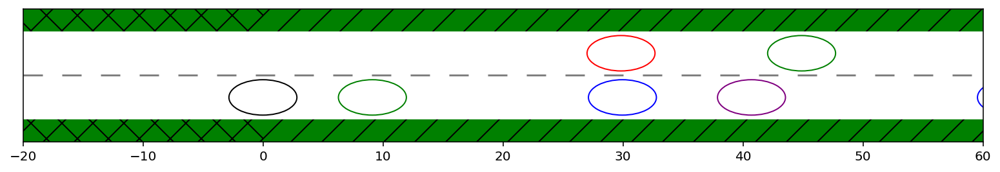

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/6915-8g21-20210526-201603


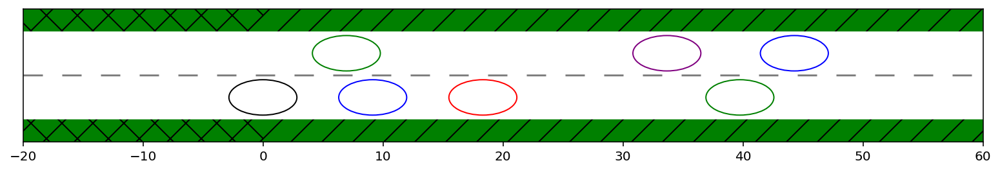

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/dh11-625c-20210525-214315


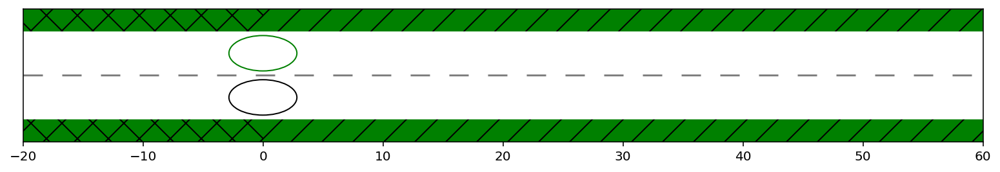

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/e5h4-411h-20210526-033849


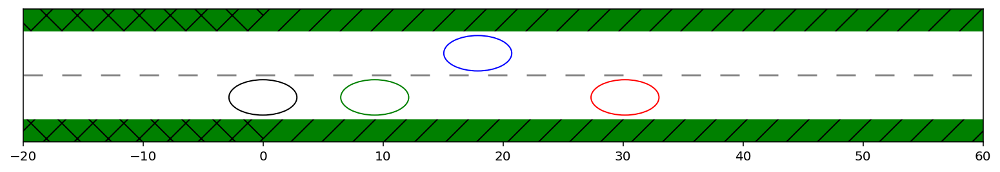

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/h5cc-260b-20210527-045922


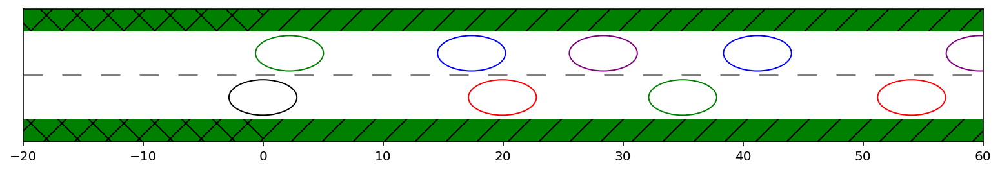

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/057a-hd30-20210526-184627


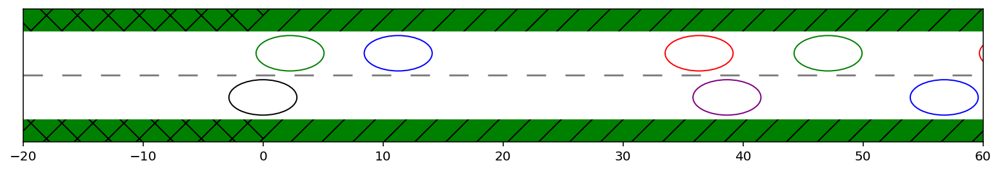

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/855e-4e79-20210526-134121


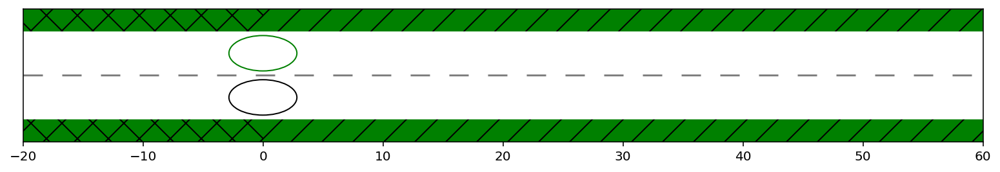

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/egfg-9gfb-20210527-010404


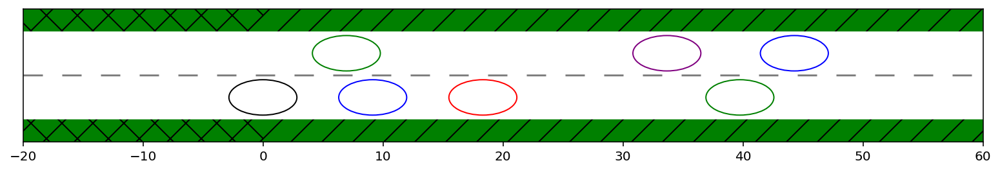

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/1hd7-h55b-20210527-002459


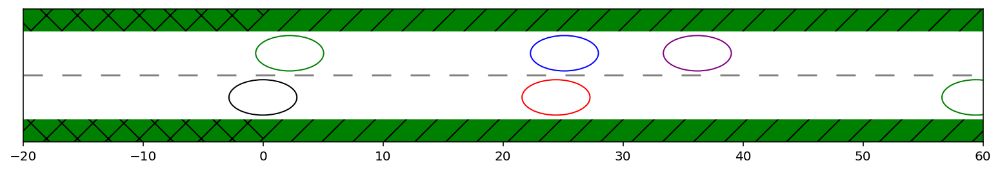

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/gc51-af27-20210527-025531


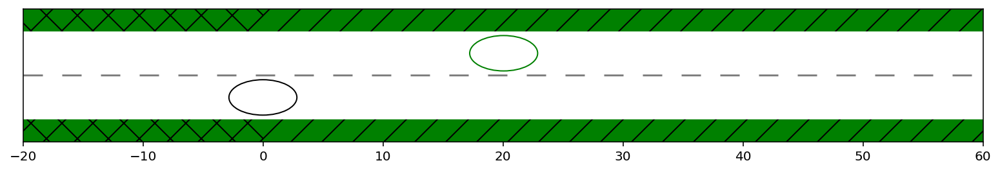

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/76be-caa3-20210526-000559


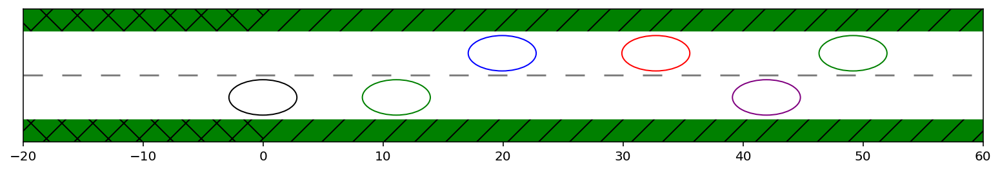

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/a601-9484-20210527-041712


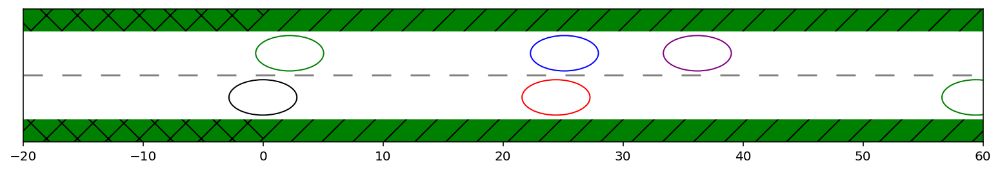

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/h9cc-2gha-20210525-204639


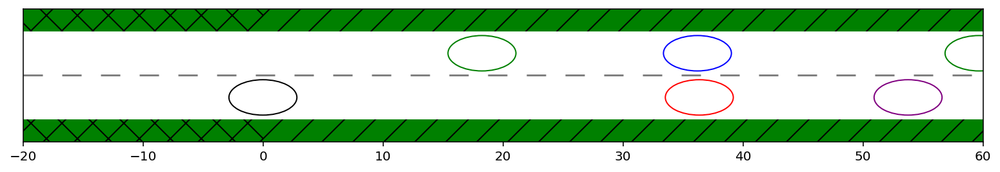

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4bc5-2dd6-20210525-190520


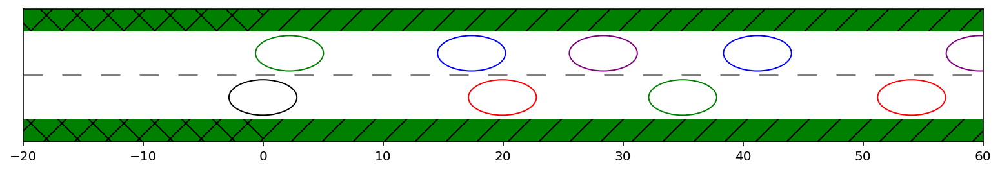

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/egbf-39hg-20210526-063103


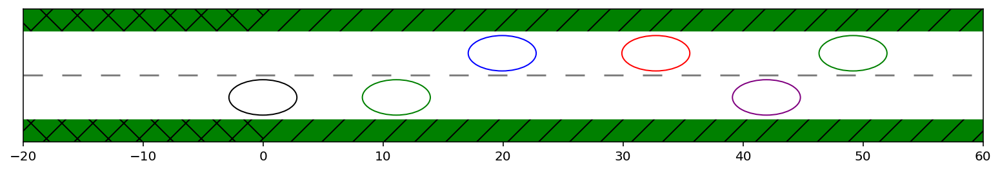

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/7c22-4257-20210527-113603


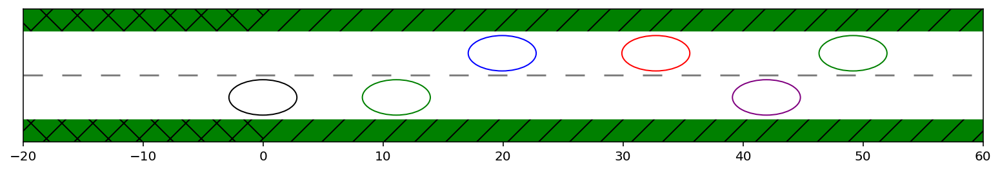

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/e6a5-06c9-20210526-030211


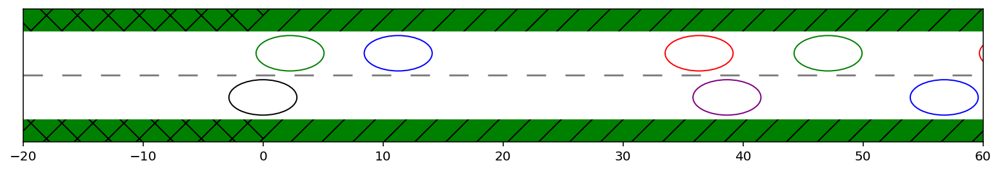

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/b804-ch00-20210526-012523


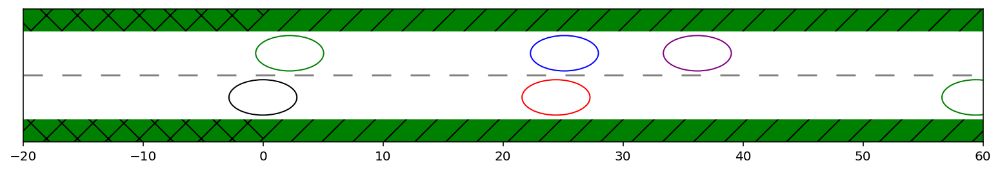

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/h85g-f08f-20210526-115346


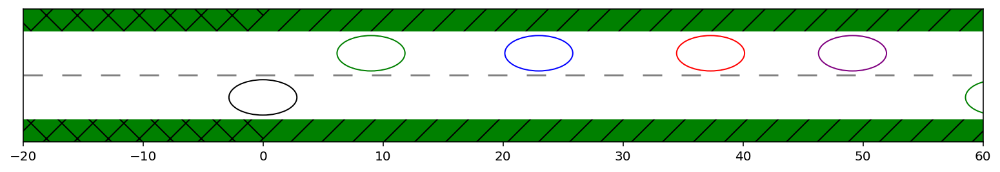

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/dd4a-e2e1-20210526-203312


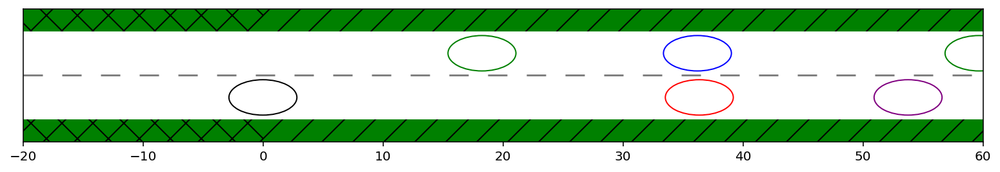

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/5441-1f4f-20210527-111453


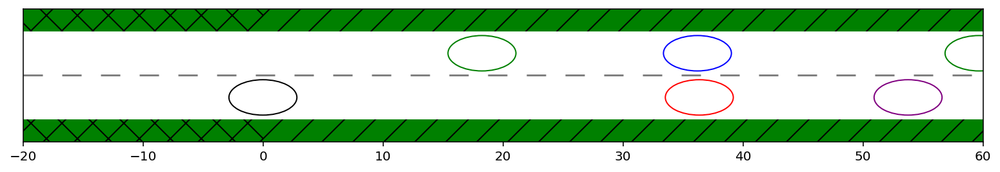

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/406b-f7ce-20210525-130459


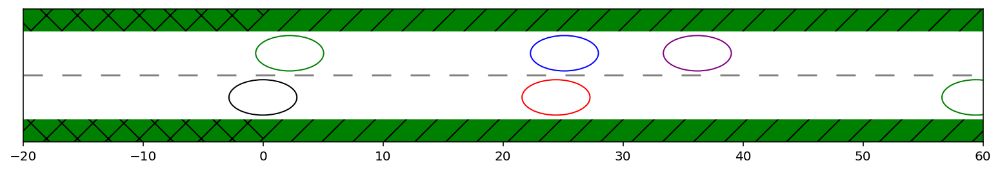

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2092-086h-20210526-214840


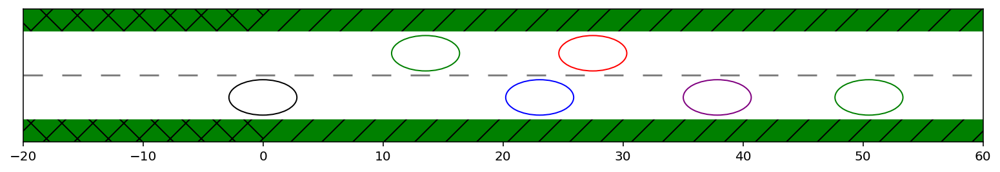

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/c2hf-8d0b-20210526-213959


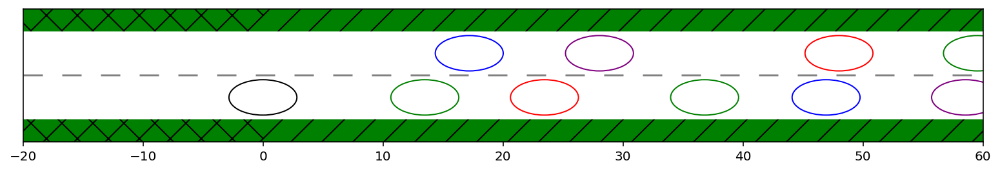

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/7962-311d-20210526-082717


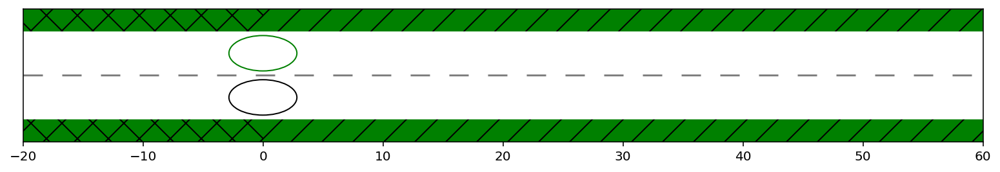

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/dd3f-3h72-20210526-125522


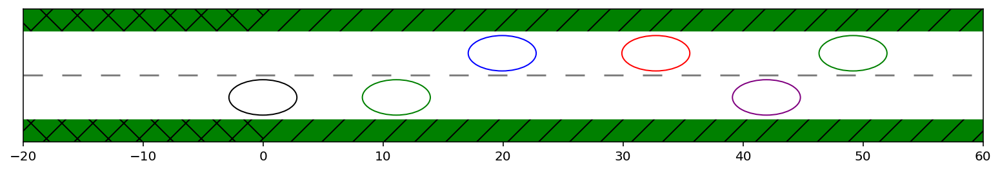

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/447c-76gd-20210527-070423


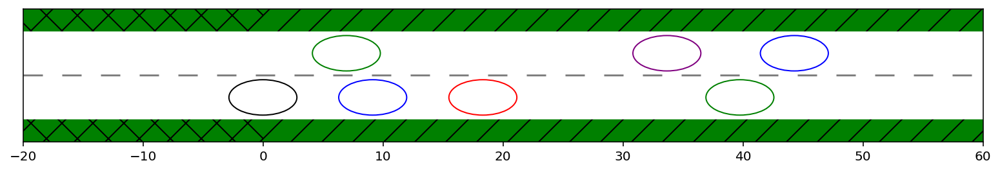

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/dceb-h8h6-20210526-190313


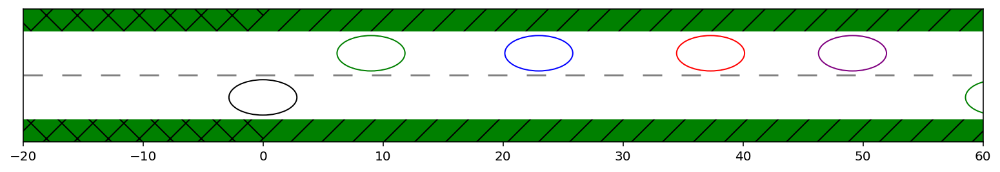

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/809a-6e8h-20210527-013349


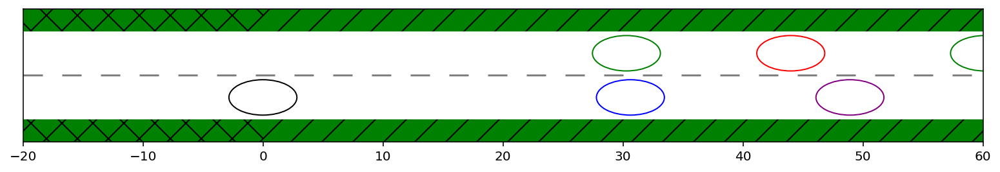

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/c479-01ab-20210525-130459


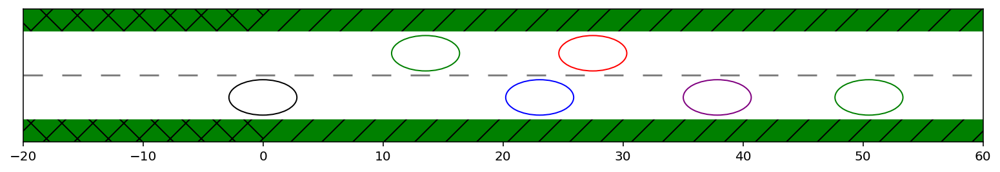

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/58a5-e8ff-20210526-175832


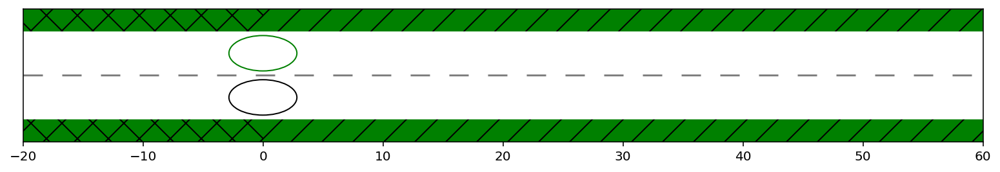

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/0770-4f70-20210527-071120


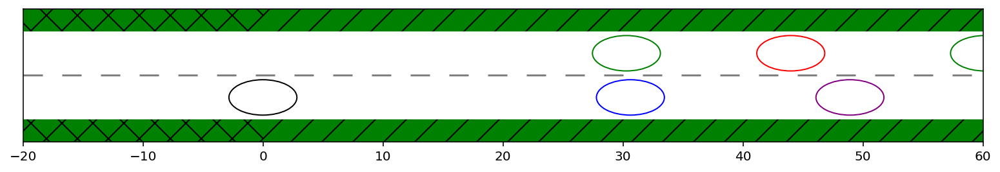

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/03d1-6a89-20210526-190705


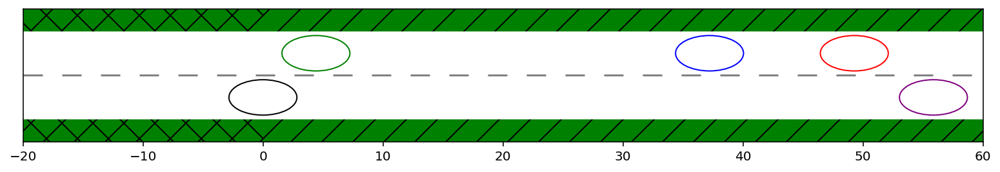

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/1daf-f477-20210527-010422


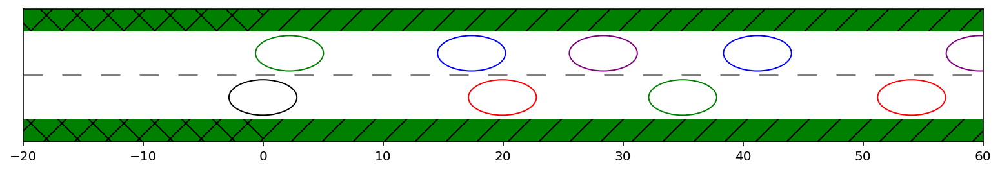

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/hc5c-6032-20210526-123517


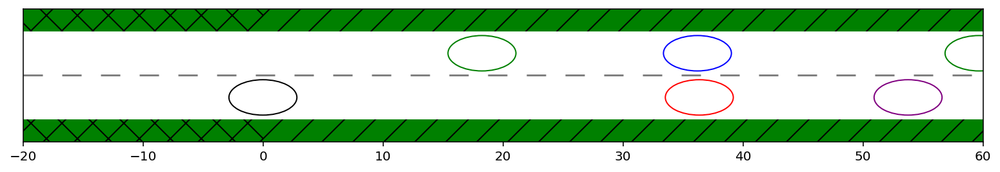

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/9122-ed75-20210526-160714


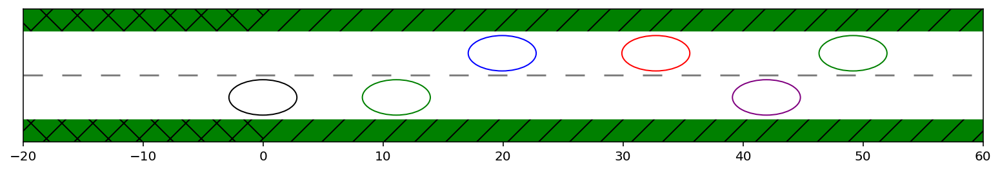

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/d9d0-gbhd-20210526-123301


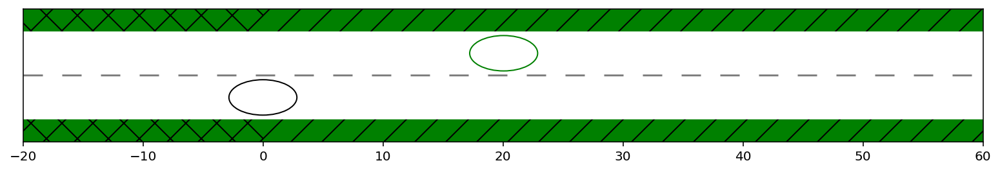

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g9c7-g633-20210527-000315


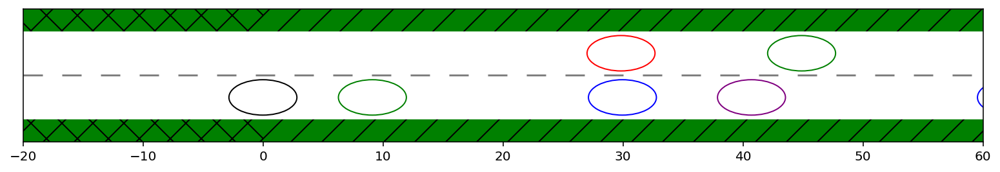

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8b53-a1c3-20210525-222935


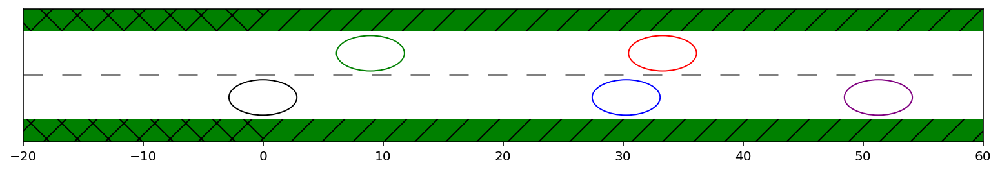

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/g35f-c828-20210525-165436


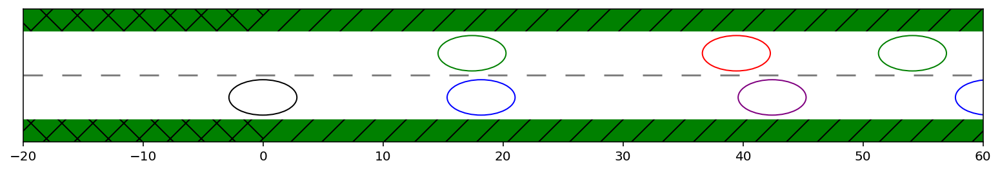

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/8c62-4g3e-20210525-130459


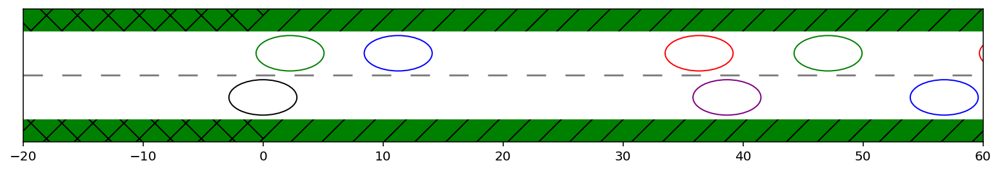

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/h97d-61ea-20210525-233404


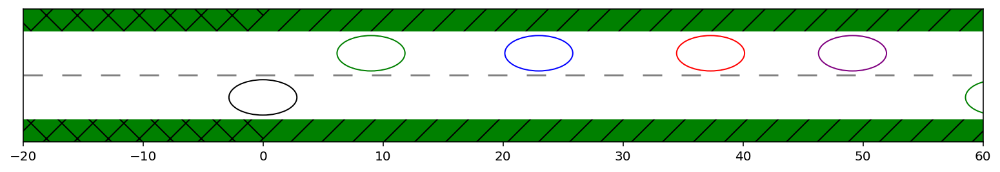

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/2d4f-4bhd-20210527-094430


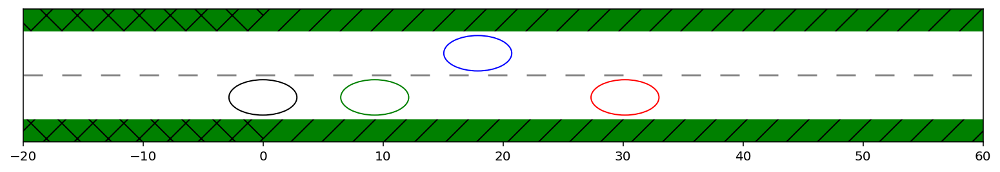

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/68g5-c162-20210526-120518


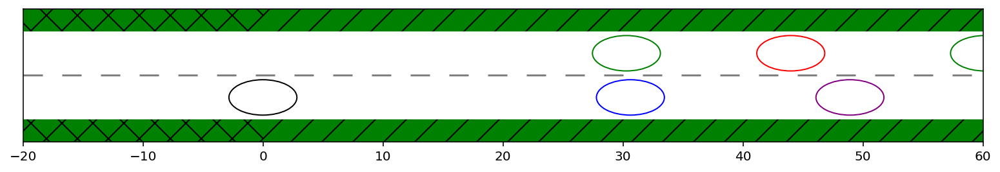

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/03d8-fh06-20210525-182518


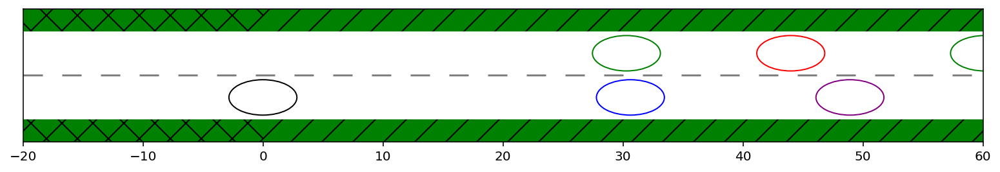

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/4dec-4af9-20210527-115205


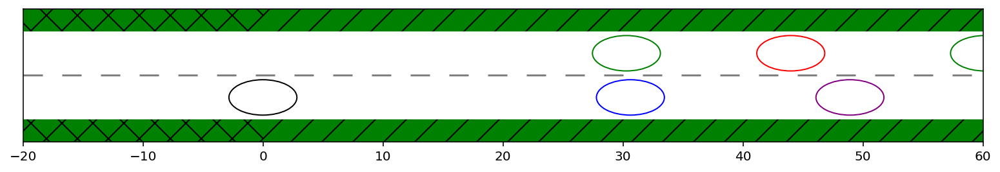

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/132h-f60f-20210526-163634


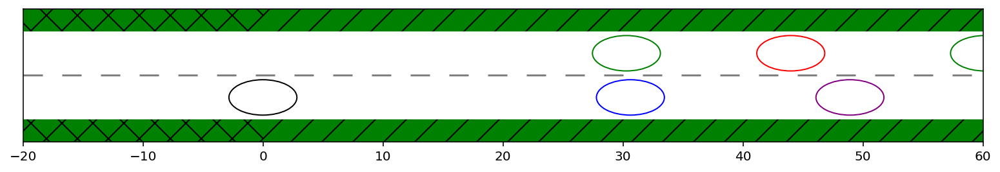

/home/nbuckman/mpc_results/tx2_05_25_pairwise/results/71bc-571b-20210526-052518


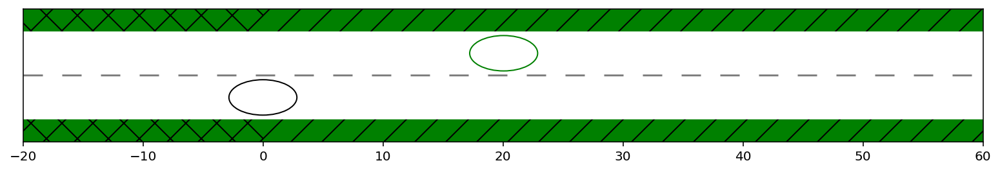

In [33]:
n_plotting_sims = 999
for si in range(min(n_plotting_sims, len(all_dirs))):
    log_dir = sim_dirs[si]
    params_path = glob.glob(log_dir + '/*/params.json')
    trajs_path = glob.glob(log_dir + '/*/trajectories.npy')
    vehicles_path = glob.glob(log_dir + '/*/other_vehicles.p')
    world_path = glob.glob(log_dir + '/*/world.p')
    ambulance_path = glob.glob(log_dir + '/*/ambulance.p')

    if len(trajs_path) > 0:
        params = json.load(open(params_path[0],'rb'))
        trajs = np.load(trajs_path[0])
        vehicles = pickle.load(open(vehicles_path[0],'rb'))
        world = pickle.load(open(world_path[0],'rb'))
        ambulance = pickle.load(open(ambulance_path[0],'rb'))
    other_trajs = [trajs[i,:] for i in range(1, trajs.shape[0])]

    print(log_dir)
    plot_multiple_cars(0, world, ambulance, trajs[0,:], other_trajs, None, "ellipse", camera_positions=None,
                       car_labels=None, car_colors=None)

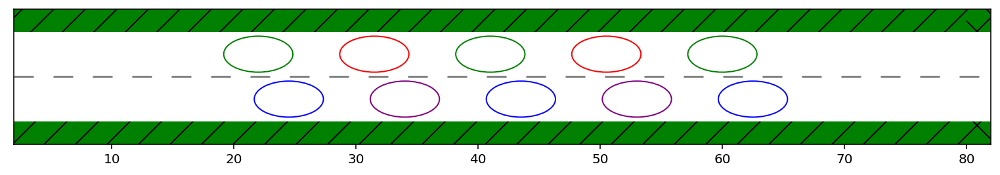

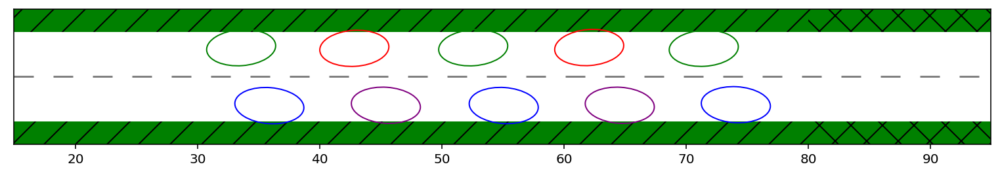

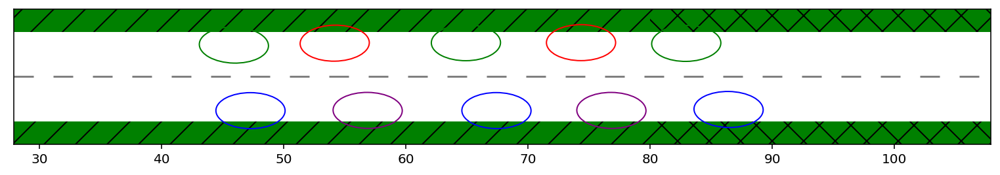

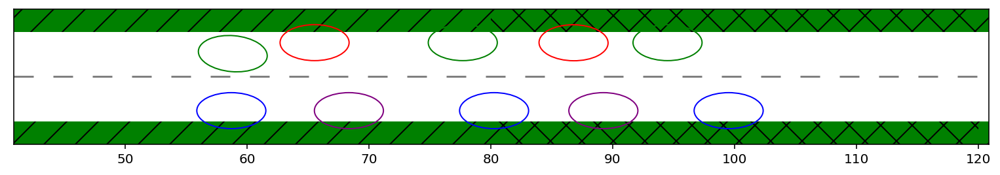

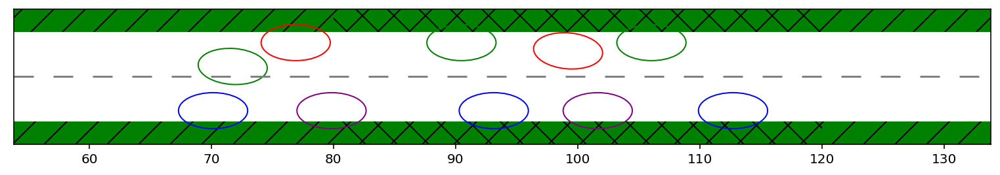

...

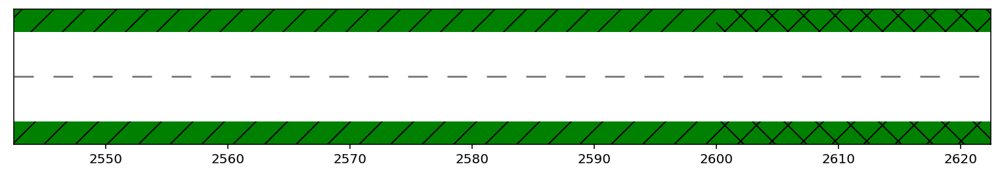

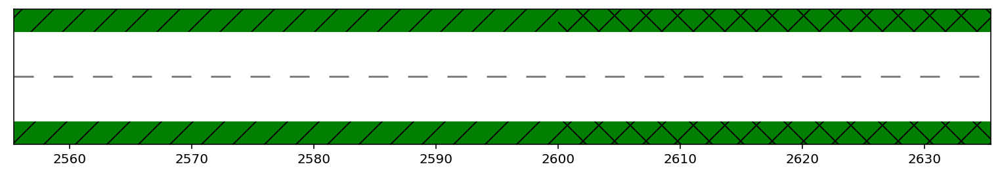

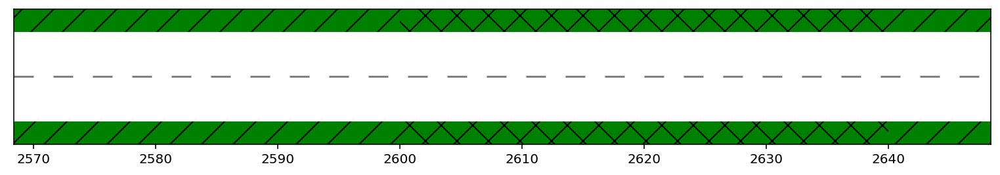

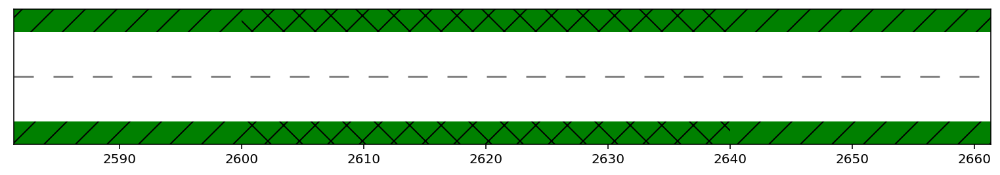

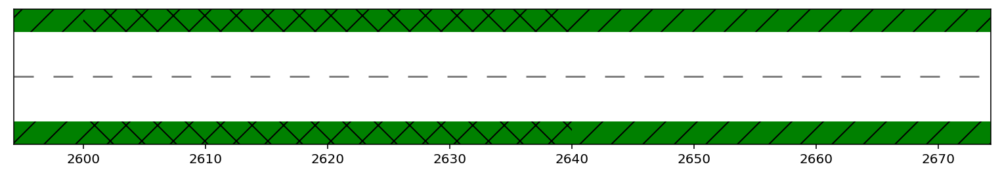

In [23]:

si = 30
log_dir = all_dirs[si]
params_path = glob.glob(log_dir + '/params.json')
trajs_path = glob.glob(log_dir + '/trajectories.npy')
vehicles_path = glob.glob(log_dir + '/other_vehicles.p')
world_path = glob.glob(log_dir + '/world.p')
# ambulance_path = glob.glob(log_dir + '/ambulance.p')

if len(trajs_path) > 0:
    params = json.load(open(params_path[0],'rb'))
    trajs = np.load(trajs_path[0])
    vehicles = pickle.load(open(vehicles_path[0],'rb'))
    world = pickle.load(open(world_path[0],'rb'))
#     ambulance = pickle.load(open(ambulance_path[0],'rb'))
other_trajs = [trajs[i,:] for i in range(0, trajs.shape[0])]

for k in range(0, trajs.shape[2], 5):
    plot_multiple_cars(k, world, None, None, other_trajs, None, "ellipse", camera_positions=None,
                       car_labels=None, car_colors=None, all_other_vehicles=vehicles)

In [24]:
params["car_density"]

5000

### Where does the ambulance pass the other vehicles

In [37]:
n_plotting_sims = 9999
amb_passing = []
all_pass_veh_mpc = []
for si in range(min(n_plotting_sims, len(all_dirs))):
    log_dir = sim_dirs[si]
    params_path = glob.glob(log_dir + '/*/params.json')
    trajs_path = glob.glob(log_dir + '/*/trajectories.npy')
    vehicles_path = glob.glob(log_dir + '/*/other_vehicles.p')
    world_path = glob.glob(log_dir + '/*/world.p')
    ambulance_path = glob.glob(log_dir + '/*/ambulance.p')

    if len(trajs_path) > 0:
        params = json.load(open(params_path[0],'rb'))
        trajs = np.load(trajs_path[0])
        vehicles = pickle.load(open(vehicles_path[0],'rb'))
        world = pickle.load(open(world_path[0],'rb'))
        ambulance = pickle.load(open(ambulance_path[0],'rb'))
    other_trajs = [trajs[i,:] for i in range(1, trajs.shape[0])]
    pass_veh_mpc = np.argmax(trajs[0,0,:]>trajs[:,0,:], axis=1)
    all_pass_veh_mpc += [pass_veh_mpc]
    max_pass_mpc = np.max(np.argmax(trajs[0,0,:]>trajs[:,0,:], axis=1))
    amb_passing +=[max_pass_mpc]
# print(sim_max_mpc)

In [38]:
for i in range(1,trajs.shape[0]):
    ambulance_pass_index = np.argmax(trajs[0,0,:]>trajs[i,0,:])
    print(ambulance_last_pass)

NameError: name 'ambulance_last_pass' is not defined

(array([31., 16.,  6.,  7., 11., 21.,  7.,  7., 18., 55.]),
 array([  0. ,  39.9,  79.8, 119.7, 159.6, 199.5, 239.4, 279.3, 319.2,
        359.1, 399. ]),
 <BarContainer object of 10 artists>)

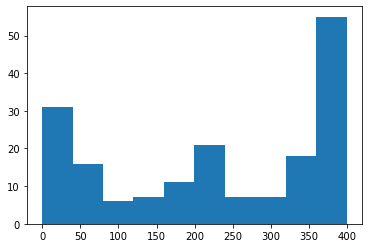

In [39]:
plt.hist(amb_passing)

In [ ]:
all_pass_veh_mpc = np.array(all_pass_veh_mpc)

In [ ]:
for i in range(all_pass_veh_mpc.shape[1]):
    plt.hist(all_pass_veh_mpc[:,i])
    plt.title('%d'%i)
    plt.show()

In [ ]:
all_pass_veh_mpc.shape

In [ ]:
dir()

In [ ]:
print([p['start_time_string'] for p in all_params if p['p_cooperative'] == 0.9])

In [43]:
for sim in range(len(all_dirs)):
    if all_params[sim]['p_cooperative'] == 0.0:
#         print(all_params[sim]['start_time_string'])
        print(all_dirs[sim])

/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/2h36-945h-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/80f7-6b2b-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/dd1f-96a0-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/3fce-gbed-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/d397-1gec-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/98c9-c170-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/4801-h12d-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/5h52-g0h9-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/9778-h6c4-20210512-120558
/home/nbuckman/mpc_results/tx2_05_12_grassfixed/results/3agf-c2g5-20210512-120558
